# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

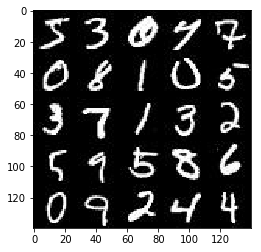

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

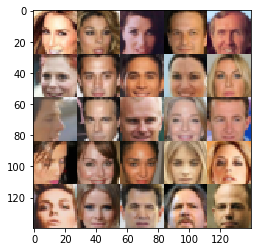

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :param alpha: Leaky ReLU factor (additionally added)
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):       
        # Image size is 28x28x3
        x1 = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=2, padding='same')
        x1 = tf.maximum(x1, x1 * alpha)
        
        # Image size is 14x14x64
        x2 = tf.layers.conv2d(x1, filters=128, kernel_size=5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(x2, x2 * alpha)
        
        # Image size is 8x8x128
        x3 = tf.layers.conv2d(x2, filters=256, kernel_size=5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(x3, x3 * alpha)
        
        flat = tf.reshape(x3, (-1, 8*8*128))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :param alpha: Leaky ReLU (added)
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512, activation=None) 
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(x1, x1 * alpha)
        # 7x7x256
        
        x2 = tf.layers.conv2d_transpose(x1, filters=256, kernel_size=5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(x2, x2 * alpha)
        # 14x14x256
        
        x3 = tf.layers.conv2d_transpose(x2, filters=128, kernel_size=5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(x3, x3 * alpha)
        # 28x28x128
        
        # Output layer 
        logits = tf.layers.conv2d_transpose(x3, filters=out_channel_dim, kernel_size=5, strides=1, padding='same')
        # 28 x 28 x outchannel_dim
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    # TODO: Build Model with previous functions
    
    # Reset everything
    #tf.reset_default_graph()
    
    # Generate model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3]) #mimic input channels
    d_train_opt, g_train_opt= model_opt(d_loss, g_loss, learning_rate, beta1)
    
    # Verbose variable
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps +=1
                
                # Scale images
                batch_images *=2
                
                # Sample random noise for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run Optimizzzzzzzers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z}) # needs images?
                
                # Verbose output
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % 50 == 0:
                    show_generator_output(sess, 20, input_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.0578... Generator Loss: 11.3536
Epoch 1/2... Discriminator Loss: 0.1069... Generator Loss: 7.5171
Epoch 1/2... Discriminator Loss: 0.0144... Generator Loss: 4.7003
Epoch 1/2... Discriminator Loss: 4.3953... Generator Loss: 0.0446
Epoch 1/2... Discriminator Loss: 3.0776... Generator Loss: 0.7454


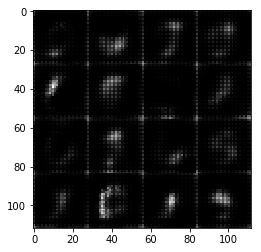

Epoch 1/2... Discriminator Loss: 2.9104... Generator Loss: 0.2103
Epoch 1/2... Discriminator Loss: 1.6918... Generator Loss: 0.6357
Epoch 1/2... Discriminator Loss: 0.9429... Generator Loss: 0.7405
Epoch 1/2... Discriminator Loss: 0.9913... Generator Loss: 2.0120
Epoch 1/2... Discriminator Loss: 0.8416... Generator Loss: 1.6770


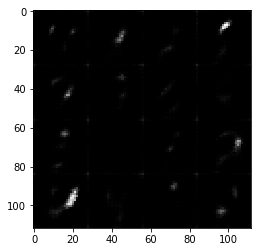

Epoch 1/2... Discriminator Loss: 0.8107... Generator Loss: 1.0124
Epoch 1/2... Discriminator Loss: 1.0661... Generator Loss: 1.0657
Epoch 1/2... Discriminator Loss: 1.3451... Generator Loss: 1.4975
Epoch 1/2... Discriminator Loss: 1.1294... Generator Loss: 0.7992
Epoch 1/2... Discriminator Loss: 1.3281... Generator Loss: 0.8061


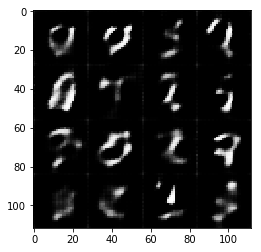

Epoch 1/2... Discriminator Loss: 1.1900... Generator Loss: 0.6672
Epoch 1/2... Discriminator Loss: 1.2375... Generator Loss: 0.6984
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 1.0239
Epoch 1/2... Discriminator Loss: 1.5724... Generator Loss: 0.6229
Epoch 1/2... Discriminator Loss: 1.2624... Generator Loss: 0.6234


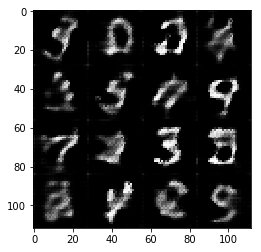

Epoch 1/2... Discriminator Loss: 0.9239... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 1.4826... Generator Loss: 0.5367
Epoch 1/2... Discriminator Loss: 1.5358... Generator Loss: 0.4424
Epoch 1/2... Discriminator Loss: 1.7741... Generator Loss: 0.3141
Epoch 1/2... Discriminator Loss: 1.2821... Generator Loss: 0.6940


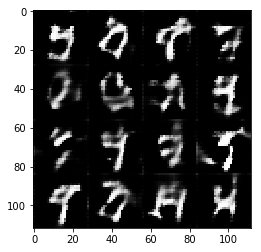

Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 0.9469
Epoch 1/2... Discriminator Loss: 1.3337... Generator Loss: 0.6796
Epoch 1/2... Discriminator Loss: 1.5550... Generator Loss: 0.4303
Epoch 1/2... Discriminator Loss: 1.2207... Generator Loss: 0.5004
Epoch 1/2... Discriminator Loss: 1.0800... Generator Loss: 1.7544


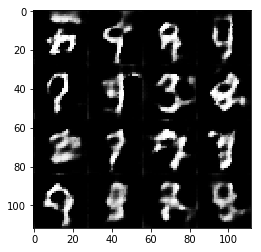

Epoch 1/2... Discriminator Loss: 1.2432... Generator Loss: 0.6091
Epoch 1/2... Discriminator Loss: 1.2966... Generator Loss: 0.7984
Epoch 1/2... Discriminator Loss: 1.0214... Generator Loss: 0.9140
Epoch 1/2... Discriminator Loss: 1.1892... Generator Loss: 0.7147
Epoch 1/2... Discriminator Loss: 1.1225... Generator Loss: 1.7395


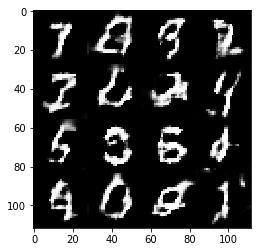

Epoch 1/2... Discriminator Loss: 1.2813... Generator Loss: 0.8322
Epoch 1/2... Discriminator Loss: 1.4735... Generator Loss: 0.5246
Epoch 1/2... Discriminator Loss: 0.9327... Generator Loss: 1.4474
Epoch 1/2... Discriminator Loss: 1.0837... Generator Loss: 1.2022
Epoch 1/2... Discriminator Loss: 1.4353... Generator Loss: 0.5653


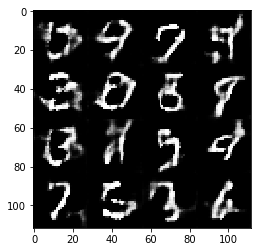

Epoch 1/2... Discriminator Loss: 1.0522... Generator Loss: 0.7431
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 1.0906
Epoch 1/2... Discriminator Loss: 1.3109... Generator Loss: 1.4893
Epoch 1/2... Discriminator Loss: 1.1791... Generator Loss: 0.9389
Epoch 1/2... Discriminator Loss: 0.8054... Generator Loss: 1.0220


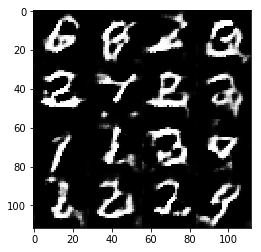

Epoch 1/2... Discriminator Loss: 1.0126... Generator Loss: 1.0615
Epoch 1/2... Discriminator Loss: 1.1656... Generator Loss: 0.6152
Epoch 1/2... Discriminator Loss: 1.1195... Generator Loss: 0.6977
Epoch 1/2... Discriminator Loss: 0.9449... Generator Loss: 0.9098
Epoch 1/2... Discriminator Loss: 1.2268... Generator Loss: 0.5475


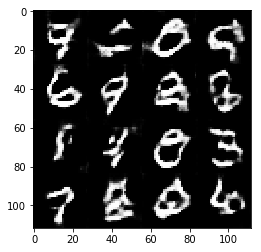

Epoch 1/2... Discriminator Loss: 1.1303... Generator Loss: 1.2884
Epoch 1/2... Discriminator Loss: 1.0861... Generator Loss: 0.7453
Epoch 1/2... Discriminator Loss: 1.2735... Generator Loss: 1.8052
Epoch 1/2... Discriminator Loss: 1.1214... Generator Loss: 0.6181
Epoch 1/2... Discriminator Loss: 1.0578... Generator Loss: 1.1407


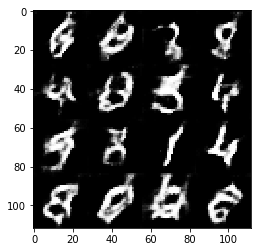

Epoch 1/2... Discriminator Loss: 1.4088... Generator Loss: 1.4344
Epoch 1/2... Discriminator Loss: 1.7309... Generator Loss: 0.2953
Epoch 1/2... Discriminator Loss: 1.0494... Generator Loss: 0.7989
Epoch 1/2... Discriminator Loss: 1.1159... Generator Loss: 0.7704
Epoch 1/2... Discriminator Loss: 1.3499... Generator Loss: 0.3832


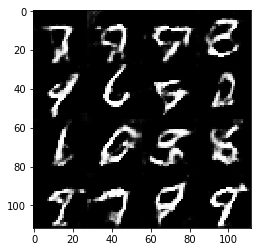

Epoch 1/2... Discriminator Loss: 0.9658... Generator Loss: 1.2118
Epoch 1/2... Discriminator Loss: 1.1182... Generator Loss: 1.1677
Epoch 1/2... Discriminator Loss: 1.0633... Generator Loss: 1.0962
Epoch 1/2... Discriminator Loss: 1.0118... Generator Loss: 0.7796
Epoch 1/2... Discriminator Loss: 1.0248... Generator Loss: 1.4172


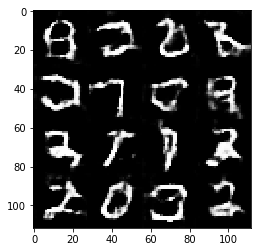

Epoch 1/2... Discriminator Loss: 1.2854... Generator Loss: 0.4575
Epoch 1/2... Discriminator Loss: 1.4030... Generator Loss: 0.6588
Epoch 1/2... Discriminator Loss: 1.6077... Generator Loss: 0.3103
Epoch 1/2... Discriminator Loss: 0.9591... Generator Loss: 1.2576
Epoch 1/2... Discriminator Loss: 1.2170... Generator Loss: 1.8035


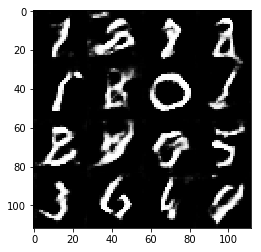

Epoch 1/2... Discriminator Loss: 1.4178... Generator Loss: 0.5015
Epoch 1/2... Discriminator Loss: 1.5618... Generator Loss: 0.3506
Epoch 1/2... Discriminator Loss: 1.1592... Generator Loss: 1.9304
Epoch 1/2... Discriminator Loss: 1.0368... Generator Loss: 2.1108
Epoch 1/2... Discriminator Loss: 1.3013... Generator Loss: 0.4379


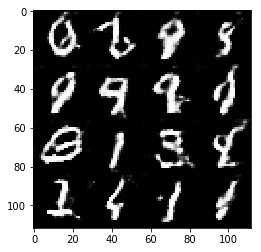

Epoch 1/2... Discriminator Loss: 1.1953... Generator Loss: 0.5760
Epoch 1/2... Discriminator Loss: 0.9320... Generator Loss: 0.9392
Epoch 1/2... Discriminator Loss: 1.4469... Generator Loss: 0.3814
Epoch 1/2... Discriminator Loss: 1.1021... Generator Loss: 0.6988
Epoch 1/2... Discriminator Loss: 1.0954... Generator Loss: 1.5372


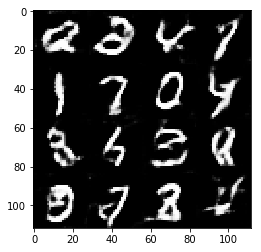

Epoch 1/2... Discriminator Loss: 0.9468... Generator Loss: 1.1619
Epoch 1/2... Discriminator Loss: 0.8278... Generator Loss: 1.3769
Epoch 1/2... Discriminator Loss: 0.9324... Generator Loss: 0.8634
Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 0.8371
Epoch 1/2... Discriminator Loss: 0.9434... Generator Loss: 0.8570


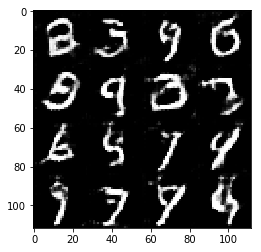

Epoch 1/2... Discriminator Loss: 1.4741... Generator Loss: 0.5429
Epoch 1/2... Discriminator Loss: 1.4609... Generator Loss: 1.1281
Epoch 1/2... Discriminator Loss: 1.1134... Generator Loss: 1.0700
Epoch 1/2... Discriminator Loss: 1.1584... Generator Loss: 0.5623
Epoch 1/2... Discriminator Loss: 1.0001... Generator Loss: 0.7949


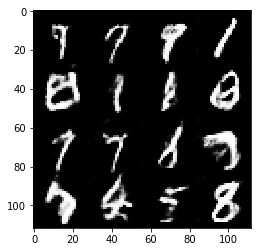

Epoch 1/2... Discriminator Loss: 1.4541... Generator Loss: 0.3932
Epoch 1/2... Discriminator Loss: 0.9595... Generator Loss: 0.8646
Epoch 1/2... Discriminator Loss: 0.9370... Generator Loss: 0.7614
Epoch 2/2... Discriminator Loss: 0.8692... Generator Loss: 1.0200
Epoch 2/2... Discriminator Loss: 0.9165... Generator Loss: 1.6252


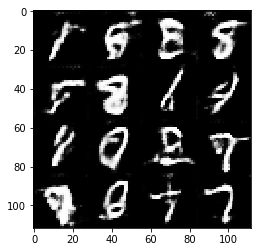

Epoch 2/2... Discriminator Loss: 1.7820... Generator Loss: 0.2538
Epoch 2/2... Discriminator Loss: 1.0780... Generator Loss: 1.3853
Epoch 2/2... Discriminator Loss: 0.9765... Generator Loss: 1.0461
Epoch 2/2... Discriminator Loss: 1.4706... Generator Loss: 0.3778
Epoch 2/2... Discriminator Loss: 1.0446... Generator Loss: 0.7827


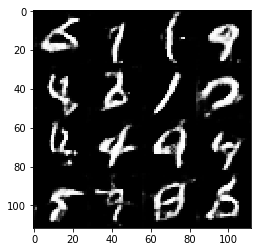

Epoch 2/2... Discriminator Loss: 1.2597... Generator Loss: 0.7147
Epoch 2/2... Discriminator Loss: 0.9518... Generator Loss: 0.7921
Epoch 2/2... Discriminator Loss: 0.8084... Generator Loss: 0.9207
Epoch 2/2... Discriminator Loss: 1.1509... Generator Loss: 1.2935
Epoch 2/2... Discriminator Loss: 1.0592... Generator Loss: 0.9079


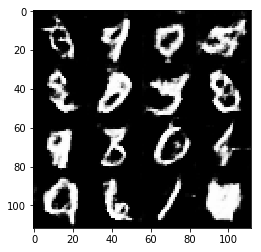

Epoch 2/2... Discriminator Loss: 1.2240... Generator Loss: 0.4943
Epoch 2/2... Discriminator Loss: 1.4096... Generator Loss: 0.3728
Epoch 2/2... Discriminator Loss: 1.0628... Generator Loss: 0.6247
Epoch 2/2... Discriminator Loss: 1.0284... Generator Loss: 0.7009
Epoch 2/2... Discriminator Loss: 2.1034... Generator Loss: 0.1886


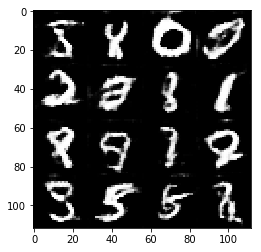

Epoch 2/2... Discriminator Loss: 0.7627... Generator Loss: 0.9767
Epoch 2/2... Discriminator Loss: 0.5849... Generator Loss: 1.4117
Epoch 2/2... Discriminator Loss: 0.8125... Generator Loss: 1.1476
Epoch 2/2... Discriminator Loss: 1.2171... Generator Loss: 2.4181
Epoch 2/2... Discriminator Loss: 1.5501... Generator Loss: 0.4530


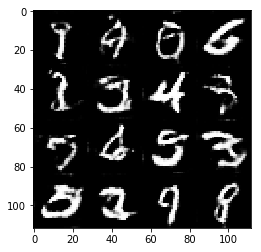

Epoch 2/2... Discriminator Loss: 1.1457... Generator Loss: 0.6100
Epoch 2/2... Discriminator Loss: 1.1639... Generator Loss: 0.5651
Epoch 2/2... Discriminator Loss: 0.7938... Generator Loss: 0.8380
Epoch 2/2... Discriminator Loss: 1.0230... Generator Loss: 1.2599
Epoch 2/2... Discriminator Loss: 1.1174... Generator Loss: 0.5715


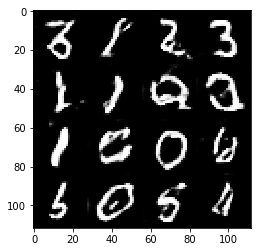

Epoch 2/2... Discriminator Loss: 0.7220... Generator Loss: 1.1127
Epoch 2/2... Discriminator Loss: 1.1322... Generator Loss: 0.8966
Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 1.5262
Epoch 2/2... Discriminator Loss: 1.1501... Generator Loss: 0.5561
Epoch 2/2... Discriminator Loss: 1.6164... Generator Loss: 1.8826


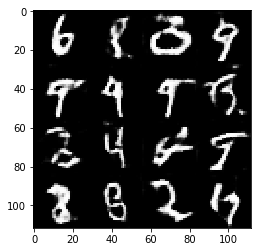

Epoch 2/2... Discriminator Loss: 1.1150... Generator Loss: 0.7383
Epoch 2/2... Discriminator Loss: 1.5346... Generator Loss: 0.3519
Epoch 2/2... Discriminator Loss: 1.7876... Generator Loss: 0.2457
Epoch 2/2... Discriminator Loss: 0.7135... Generator Loss: 1.7728
Epoch 2/2... Discriminator Loss: 2.3613... Generator Loss: 4.2880


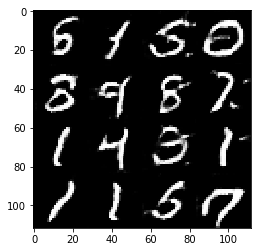

Epoch 2/2... Discriminator Loss: 1.4420... Generator Loss: 0.4319
Epoch 2/2... Discriminator Loss: 1.1942... Generator Loss: 1.0425
Epoch 2/2... Discriminator Loss: 0.9419... Generator Loss: 0.8469
Epoch 2/2... Discriminator Loss: 0.8741... Generator Loss: 1.2388
Epoch 2/2... Discriminator Loss: 2.6645... Generator Loss: 0.0947


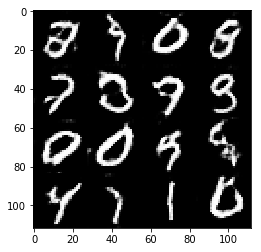

Epoch 2/2... Discriminator Loss: 1.0855... Generator Loss: 1.4038
Epoch 2/2... Discriminator Loss: 0.9902... Generator Loss: 1.5017
Epoch 2/2... Discriminator Loss: 1.0455... Generator Loss: 0.5861
Epoch 2/2... Discriminator Loss: 0.7952... Generator Loss: 1.4278
Epoch 2/2... Discriminator Loss: 2.4525... Generator Loss: 3.3600


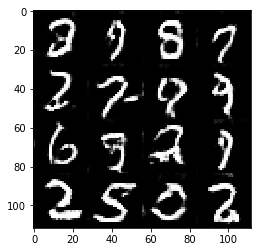

Epoch 2/2... Discriminator Loss: 1.5900... Generator Loss: 0.3639
Epoch 2/2... Discriminator Loss: 0.6968... Generator Loss: 1.4129
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 1.0343
Epoch 2/2... Discriminator Loss: 0.6321... Generator Loss: 1.3139
Epoch 2/2... Discriminator Loss: 0.7635... Generator Loss: 1.9340


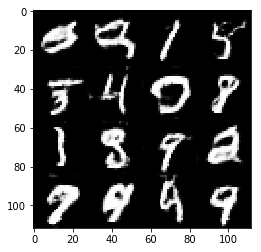

Epoch 2/2... Discriminator Loss: 0.9875... Generator Loss: 0.8441
Epoch 2/2... Discriminator Loss: 0.6599... Generator Loss: 1.4113
Epoch 2/2... Discriminator Loss: 0.8807... Generator Loss: 1.5916
Epoch 2/2... Discriminator Loss: 0.7768... Generator Loss: 1.4391
Epoch 2/2... Discriminator Loss: 0.5847... Generator Loss: 1.8415


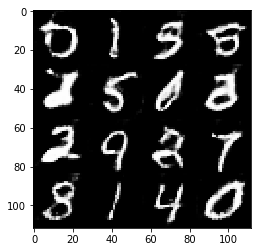

Epoch 2/2... Discriminator Loss: 0.8795... Generator Loss: 1.2591
Epoch 2/2... Discriminator Loss: 0.8771... Generator Loss: 0.8300
Epoch 2/2... Discriminator Loss: 0.4586... Generator Loss: 1.9583
Epoch 2/2... Discriminator Loss: 0.7613... Generator Loss: 1.1038
Epoch 2/2... Discriminator Loss: 0.8154... Generator Loss: 1.0527


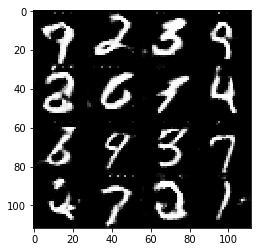

Epoch 2/2... Discriminator Loss: 1.0951... Generator Loss: 1.9961
Epoch 2/2... Discriminator Loss: 1.1244... Generator Loss: 1.7254
Epoch 2/2... Discriminator Loss: 1.2843... Generator Loss: 0.4539
Epoch 2/2... Discriminator Loss: 1.3914... Generator Loss: 1.7009
Epoch 2/2... Discriminator Loss: 0.6171... Generator Loss: 1.3450


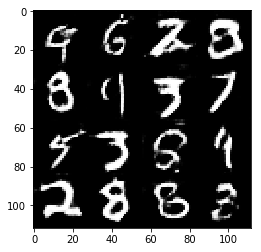

Epoch 2/2... Discriminator Loss: 1.5604... Generator Loss: 0.4086
Epoch 2/2... Discriminator Loss: 1.2371... Generator Loss: 0.6009
Epoch 2/2... Discriminator Loss: 0.8100... Generator Loss: 1.2817
Epoch 2/2... Discriminator Loss: 0.7574... Generator Loss: 1.0035
Epoch 2/2... Discriminator Loss: 1.5058... Generator Loss: 0.4940


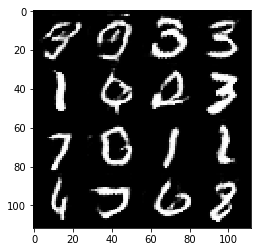

Epoch 2/2... Discriminator Loss: 0.6309... Generator Loss: 1.1366
Epoch 2/2... Discriminator Loss: 0.6061... Generator Loss: 1.0775
Epoch 2/2... Discriminator Loss: 1.3228... Generator Loss: 2.6884
Epoch 2/2... Discriminator Loss: 1.2480... Generator Loss: 0.5077
Epoch 2/2... Discriminator Loss: 1.2295... Generator Loss: 0.5135


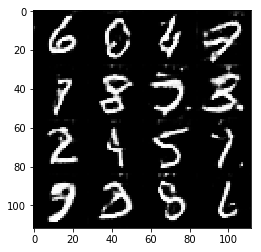

Epoch 2/2... Discriminator Loss: 0.9496... Generator Loss: 0.8719
Epoch 2/2... Discriminator Loss: 0.9308... Generator Loss: 0.8660
Epoch 2/2... Discriminator Loss: 1.3546... Generator Loss: 0.4383
Epoch 2/2... Discriminator Loss: 0.9838... Generator Loss: 1.3971
Epoch 2/2... Discriminator Loss: 0.7685... Generator Loss: 2.1137


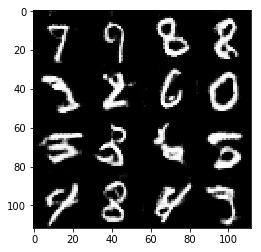

Epoch 2/2... Discriminator Loss: 0.9273... Generator Loss: 1.4254
Epoch 2/2... Discriminator Loss: 0.6222... Generator Loss: 1.2492
Epoch 2/2... Discriminator Loss: 1.2169... Generator Loss: 0.5735
Epoch 2/2... Discriminator Loss: 1.2053... Generator Loss: 0.5704
Epoch 2/2... Discriminator Loss: 1.6610... Generator Loss: 0.3768


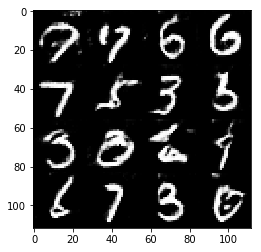

Epoch 2/2... Discriminator Loss: 1.3269... Generator Loss: 0.5140
Epoch 2/2... Discriminator Loss: 1.5174... Generator Loss: 0.3783
Epoch 2/2... Discriminator Loss: 0.8761... Generator Loss: 0.8161
Epoch 2/2... Discriminator Loss: 0.9939... Generator Loss: 1.0551
Epoch 2/2... Discriminator Loss: 0.9964... Generator Loss: 1.0553


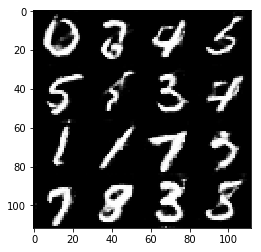

Epoch 2/2... Discriminator Loss: 0.7290... Generator Loss: 1.2090
Epoch 2/2... Discriminator Loss: 0.4923... Generator Loss: 1.5308


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.3754... Generator Loss: 0.4717
Epoch 1/5... Discriminator Loss: 0.6169... Generator Loss: 1.3579
Epoch 1/5... Discriminator Loss: 0.3293... Generator Loss: 6.1225
Epoch 1/5... Discriminator Loss: 0.3805... Generator Loss: 3.4480
Epoch 1/5... Discriminator Loss: 0.8165... Generator Loss: 1.1923


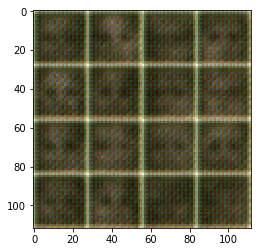

Epoch 1/5... Discriminator Loss: 0.8037... Generator Loss: 1.8972
Epoch 1/5... Discriminator Loss: 0.5514... Generator Loss: 1.4176
Epoch 1/5... Discriminator Loss: 1.6732... Generator Loss: 0.3229
Epoch 1/5... Discriminator Loss: 1.1989... Generator Loss: 0.5474
Epoch 1/5... Discriminator Loss: 1.1847... Generator Loss: 0.5105


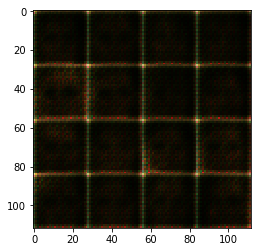

Epoch 1/5... Discriminator Loss: 2.2778... Generator Loss: 6.9725
Epoch 1/5... Discriminator Loss: 1.5309... Generator Loss: 0.3596
Epoch 1/5... Discriminator Loss: 0.4900... Generator Loss: 1.9088
Epoch 1/5... Discriminator Loss: 0.7895... Generator Loss: 0.8182
Epoch 1/5... Discriminator Loss: 0.5424... Generator Loss: 1.3642


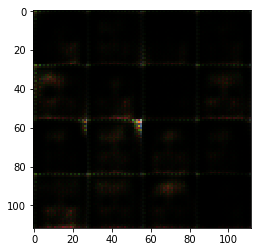

Epoch 1/5... Discriminator Loss: 2.0199... Generator Loss: 0.2024
Epoch 1/5... Discriminator Loss: 1.0421... Generator Loss: 5.7581
Epoch 1/5... Discriminator Loss: 1.4132... Generator Loss: 0.4693
Epoch 1/5... Discriminator Loss: 0.4505... Generator Loss: 4.1345
Epoch 1/5... Discriminator Loss: 1.0579... Generator Loss: 6.3231


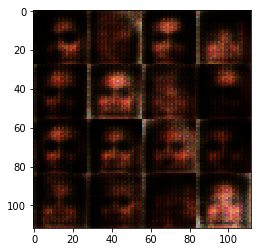

Epoch 1/5... Discriminator Loss: 3.3283... Generator Loss: 0.0711
Epoch 1/5... Discriminator Loss: 0.1801... Generator Loss: 3.5765
Epoch 1/5... Discriminator Loss: 3.2631... Generator Loss: 0.0593
Epoch 1/5... Discriminator Loss: 0.2270... Generator Loss: 2.4108
Epoch 1/5... Discriminator Loss: 0.8248... Generator Loss: 0.8606


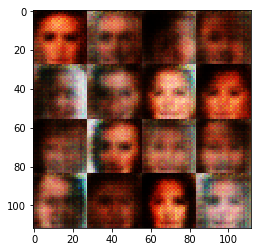

Epoch 1/5... Discriminator Loss: 1.0243... Generator Loss: 0.5448
Epoch 1/5... Discriminator Loss: 1.2809... Generator Loss: 0.4806
Epoch 1/5... Discriminator Loss: 1.0112... Generator Loss: 3.2365
Epoch 1/5... Discriminator Loss: 1.6066... Generator Loss: 0.6158
Epoch 1/5... Discriminator Loss: 0.3696... Generator Loss: 4.2988


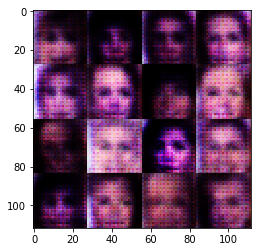

Epoch 1/5... Discriminator Loss: 1.4853... Generator Loss: 0.5545
Epoch 1/5... Discriminator Loss: 1.0468... Generator Loss: 2.4107
Epoch 1/5... Discriminator Loss: 0.8079... Generator Loss: 4.6242
Epoch 1/5... Discriminator Loss: 1.7635... Generator Loss: 0.2404
Epoch 1/5... Discriminator Loss: 1.0236... Generator Loss: 0.9710


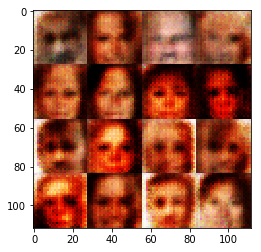

Epoch 1/5... Discriminator Loss: 1.9480... Generator Loss: 2.1523
Epoch 1/5... Discriminator Loss: 0.4039... Generator Loss: 2.7300
Epoch 1/5... Discriminator Loss: 1.1589... Generator Loss: 0.8548
Epoch 1/5... Discriminator Loss: 0.5079... Generator Loss: 1.4941
Epoch 1/5... Discriminator Loss: 1.0484... Generator Loss: 0.6106


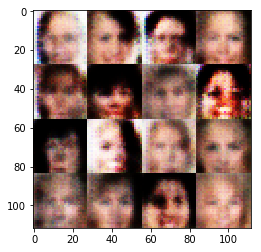

Epoch 1/5... Discriminator Loss: 0.3491... Generator Loss: 2.5385
Epoch 1/5... Discriminator Loss: 1.3760... Generator Loss: 1.8854
Epoch 1/5... Discriminator Loss: 1.7111... Generator Loss: 0.2796
Epoch 1/5... Discriminator Loss: 1.1221... Generator Loss: 0.8001
Epoch 1/5... Discriminator Loss: 1.1418... Generator Loss: 0.5820


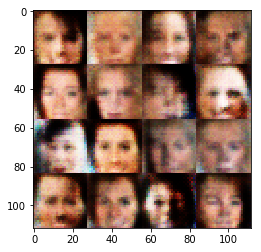

Epoch 1/5... Discriminator Loss: 1.1935... Generator Loss: 0.7893
Epoch 1/5... Discriminator Loss: 0.5155... Generator Loss: 1.1982
Epoch 1/5... Discriminator Loss: 0.7928... Generator Loss: 1.0630
Epoch 1/5... Discriminator Loss: 1.6152... Generator Loss: 0.2951
Epoch 1/5... Discriminator Loss: 0.8659... Generator Loss: 1.9301


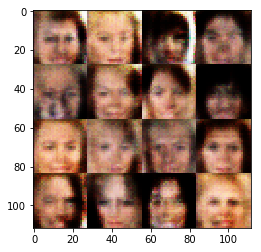

Epoch 1/5... Discriminator Loss: 1.6213... Generator Loss: 0.2799
Epoch 1/5... Discriminator Loss: 0.4926... Generator Loss: 1.7488
Epoch 1/5... Discriminator Loss: 1.9378... Generator Loss: 0.6304
Epoch 1/5... Discriminator Loss: 1.6531... Generator Loss: 0.6644
Epoch 1/5... Discriminator Loss: 0.8136... Generator Loss: 3.4222


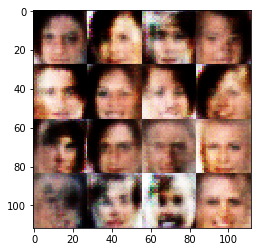

Epoch 1/5... Discriminator Loss: 0.9025... Generator Loss: 1.7492
Epoch 1/5... Discriminator Loss: 0.9840... Generator Loss: 1.2019
Epoch 1/5... Discriminator Loss: 0.5235... Generator Loss: 1.9710
Epoch 1/5... Discriminator Loss: 1.3152... Generator Loss: 0.5731
Epoch 1/5... Discriminator Loss: 1.9660... Generator Loss: 1.4262


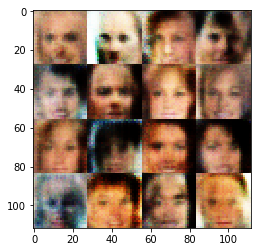

Epoch 1/5... Discriminator Loss: 0.5074... Generator Loss: 3.3198
Epoch 1/5... Discriminator Loss: 0.7529... Generator Loss: 1.5058
Epoch 1/5... Discriminator Loss: 0.6675... Generator Loss: 1.2679
Epoch 1/5... Discriminator Loss: 1.0052... Generator Loss: 0.6479
Epoch 1/5... Discriminator Loss: 1.2625... Generator Loss: 0.6112


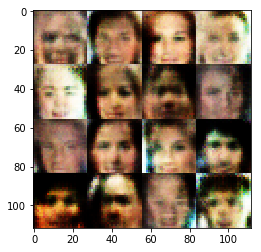

Epoch 1/5... Discriminator Loss: 1.1158... Generator Loss: 0.7730
Epoch 1/5... Discriminator Loss: 0.4447... Generator Loss: 1.5929
Epoch 1/5... Discriminator Loss: 1.0198... Generator Loss: 2.2559
Epoch 1/5... Discriminator Loss: 1.6455... Generator Loss: 0.2716
Epoch 1/5... Discriminator Loss: 1.4698... Generator Loss: 0.3064


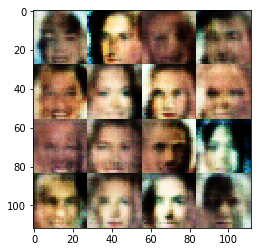

Epoch 1/5... Discriminator Loss: 0.8915... Generator Loss: 1.5365
Epoch 1/5... Discriminator Loss: 1.2291... Generator Loss: 0.4762
Epoch 1/5... Discriminator Loss: 1.1091... Generator Loss: 1.9777
Epoch 1/5... Discriminator Loss: 0.3408... Generator Loss: 2.4010
Epoch 1/5... Discriminator Loss: 0.8939... Generator Loss: 0.7774


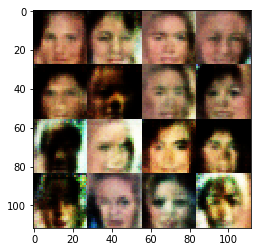

Epoch 1/5... Discriminator Loss: 1.4179... Generator Loss: 0.5628
Epoch 1/5... Discriminator Loss: 1.8536... Generator Loss: 0.2146
Epoch 1/5... Discriminator Loss: 0.7418... Generator Loss: 1.6279
Epoch 1/5... Discriminator Loss: 0.6202... Generator Loss: 1.6045
Epoch 1/5... Discriminator Loss: 0.4718... Generator Loss: 1.2488


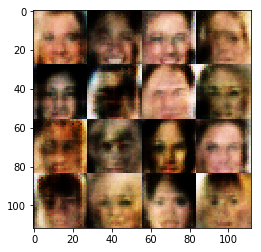

Epoch 1/5... Discriminator Loss: 1.4644... Generator Loss: 0.3331
Epoch 1/5... Discriminator Loss: 1.3980... Generator Loss: 0.7405
Epoch 1/5... Discriminator Loss: 1.2777... Generator Loss: 0.5199
Epoch 1/5... Discriminator Loss: 0.8533... Generator Loss: 2.4634
Epoch 1/5... Discriminator Loss: 1.4819... Generator Loss: 0.3937


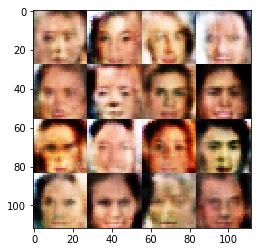

Epoch 1/5... Discriminator Loss: 1.0986... Generator Loss: 0.6099
Epoch 1/5... Discriminator Loss: 0.7097... Generator Loss: 2.6174
Epoch 1/5... Discriminator Loss: 0.5606... Generator Loss: 2.0042
Epoch 1/5... Discriminator Loss: 0.4089... Generator Loss: 2.3168
Epoch 1/5... Discriminator Loss: 0.4984... Generator Loss: 3.0899


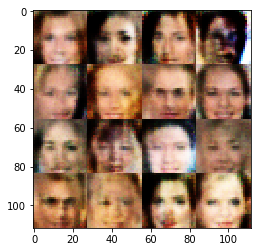

Epoch 1/5... Discriminator Loss: 0.3142... Generator Loss: 2.3192
Epoch 1/5... Discriminator Loss: 1.7979... Generator Loss: 3.2335
Epoch 1/5... Discriminator Loss: 0.3984... Generator Loss: 1.7606
Epoch 1/5... Discriminator Loss: 0.4367... Generator Loss: 2.3185
Epoch 1/5... Discriminator Loss: 1.7152... Generator Loss: 0.2509


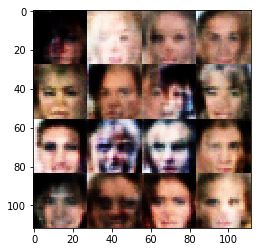

Epoch 1/5... Discriminator Loss: 1.8871... Generator Loss: 0.2336
Epoch 1/5... Discriminator Loss: 0.2977... Generator Loss: 2.0928
Epoch 1/5... Discriminator Loss: 0.3547... Generator Loss: 1.8378
Epoch 1/5... Discriminator Loss: 0.1911... Generator Loss: 2.5770
Epoch 1/5... Discriminator Loss: 1.4770... Generator Loss: 0.3430


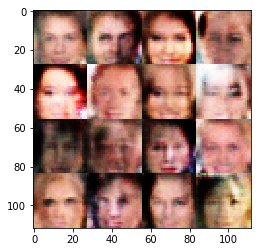

Epoch 1/5... Discriminator Loss: 0.8139... Generator Loss: 0.9060
Epoch 1/5... Discriminator Loss: 2.2162... Generator Loss: 0.1583
Epoch 1/5... Discriminator Loss: 0.3190... Generator Loss: 2.1207
Epoch 1/5... Discriminator Loss: 0.6922... Generator Loss: 1.3980
Epoch 1/5... Discriminator Loss: 1.6137... Generator Loss: 0.2773


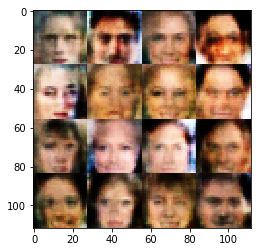

Epoch 1/5... Discriminator Loss: 0.9919... Generator Loss: 0.6130
Epoch 1/5... Discriminator Loss: 0.4000... Generator Loss: 1.7688
Epoch 1/5... Discriminator Loss: 0.6773... Generator Loss: 1.6069
Epoch 1/5... Discriminator Loss: 0.1965... Generator Loss: 2.3101
Epoch 1/5... Discriminator Loss: 0.3823... Generator Loss: 2.1918


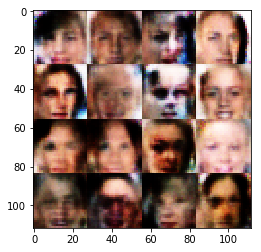

Epoch 1/5... Discriminator Loss: 1.9731... Generator Loss: 0.5240
Epoch 1/5... Discriminator Loss: 0.3828... Generator Loss: 2.3696
Epoch 1/5... Discriminator Loss: 0.3080... Generator Loss: 2.4596
Epoch 1/5... Discriminator Loss: 0.3248... Generator Loss: 5.2275
Epoch 1/5... Discriminator Loss: 1.1307... Generator Loss: 0.6626


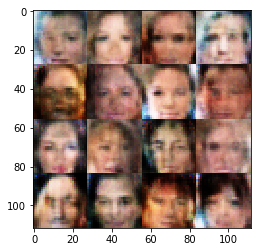

Epoch 1/5... Discriminator Loss: 0.4515... Generator Loss: 1.4797
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.3688
Epoch 1/5... Discriminator Loss: 0.6132... Generator Loss: 1.1173
Epoch 1/5... Discriminator Loss: 1.5504... Generator Loss: 0.3563
Epoch 1/5... Discriminator Loss: 0.1990... Generator Loss: 2.5975


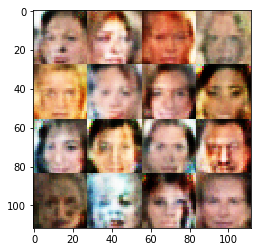

Epoch 1/5... Discriminator Loss: 0.5795... Generator Loss: 1.0801
Epoch 1/5... Discriminator Loss: 2.0630... Generator Loss: 3.9632
Epoch 1/5... Discriminator Loss: 1.2495... Generator Loss: 0.4939
Epoch 1/5... Discriminator Loss: 0.5218... Generator Loss: 3.0660
Epoch 1/5... Discriminator Loss: 1.1735... Generator Loss: 0.5008


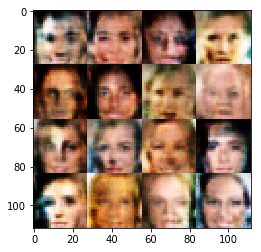

Epoch 1/5... Discriminator Loss: 0.2418... Generator Loss: 2.1510
Epoch 1/5... Discriminator Loss: 0.7757... Generator Loss: 0.9955
Epoch 1/5... Discriminator Loss: 0.8987... Generator Loss: 3.5561
Epoch 1/5... Discriminator Loss: 0.5474... Generator Loss: 1.1559
Epoch 1/5... Discriminator Loss: 0.5459... Generator Loss: 2.2425


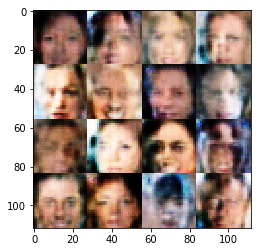

Epoch 1/5... Discriminator Loss: 0.4230... Generator Loss: 2.4774
Epoch 1/5... Discriminator Loss: 0.6827... Generator Loss: 0.8419
Epoch 1/5... Discriminator Loss: 0.7631... Generator Loss: 0.9507
Epoch 1/5... Discriminator Loss: 0.7866... Generator Loss: 2.1147
Epoch 1/5... Discriminator Loss: 0.5893... Generator Loss: 3.9442


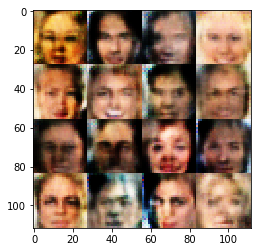

Epoch 1/5... Discriminator Loss: 1.2990... Generator Loss: 0.4659
Epoch 1/5... Discriminator Loss: 0.1923... Generator Loss: 2.8975
Epoch 1/5... Discriminator Loss: 0.5702... Generator Loss: 1.1555
Epoch 1/5... Discriminator Loss: 1.3715... Generator Loss: 0.4191
Epoch 1/5... Discriminator Loss: 1.1886... Generator Loss: 0.7986


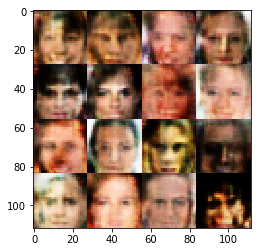

Epoch 1/5... Discriminator Loss: 0.7737... Generator Loss: 1.1352
Epoch 1/5... Discriminator Loss: 0.2213... Generator Loss: 4.4887
Epoch 1/5... Discriminator Loss: 1.2519... Generator Loss: 2.0559
Epoch 1/5... Discriminator Loss: 0.4337... Generator Loss: 2.6611
Epoch 1/5... Discriminator Loss: 1.7215... Generator Loss: 0.2921


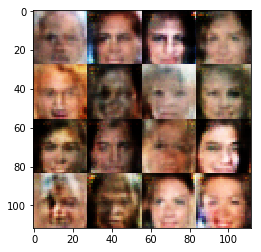

Epoch 1/5... Discriminator Loss: 0.6402... Generator Loss: 2.6185
Epoch 1/5... Discriminator Loss: 0.4603... Generator Loss: 1.8310
Epoch 1/5... Discriminator Loss: 1.3183... Generator Loss: 0.3914
Epoch 1/5... Discriminator Loss: 1.3781... Generator Loss: 0.4013
Epoch 1/5... Discriminator Loss: 1.4712... Generator Loss: 0.3873


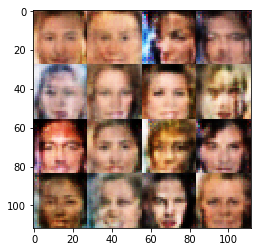

Epoch 1/5... Discriminator Loss: 0.3215... Generator Loss: 1.8750
Epoch 1/5... Discriminator Loss: 0.6200... Generator Loss: 1.3127
Epoch 1/5... Discriminator Loss: 1.5809... Generator Loss: 0.2905
Epoch 1/5... Discriminator Loss: 0.9809... Generator Loss: 1.0452
Epoch 1/5... Discriminator Loss: 0.6772... Generator Loss: 1.7770


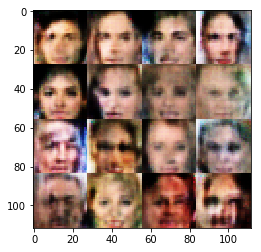

Epoch 1/5... Discriminator Loss: 0.4522... Generator Loss: 3.9541
Epoch 1/5... Discriminator Loss: 0.5573... Generator Loss: 1.1452
Epoch 1/5... Discriminator Loss: 0.2506... Generator Loss: 2.2746
Epoch 1/5... Discriminator Loss: 0.7919... Generator Loss: 0.7977
Epoch 1/5... Discriminator Loss: 0.7569... Generator Loss: 1.3731


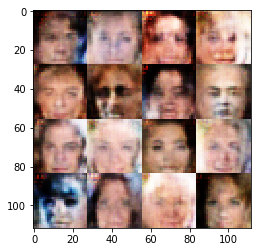

Epoch 1/5... Discriminator Loss: 0.6957... Generator Loss: 2.7124
Epoch 1/5... Discriminator Loss: 1.3167... Generator Loss: 0.7588
Epoch 1/5... Discriminator Loss: 0.4848... Generator Loss: 1.7231
Epoch 1/5... Discriminator Loss: 0.4128... Generator Loss: 1.5161
Epoch 1/5... Discriminator Loss: 0.5546... Generator Loss: 1.1509


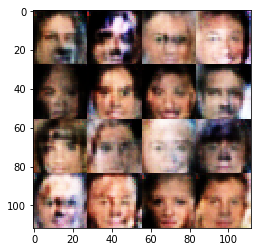

Epoch 1/5... Discriminator Loss: 0.8382... Generator Loss: 0.8514
Epoch 1/5... Discriminator Loss: 0.4848... Generator Loss: 1.9939
Epoch 1/5... Discriminator Loss: 0.2208... Generator Loss: 3.4463
Epoch 1/5... Discriminator Loss: 0.5719... Generator Loss: 1.4081
Epoch 1/5... Discriminator Loss: 0.5804... Generator Loss: 1.1506


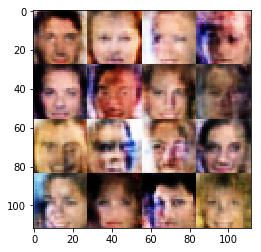

Epoch 1/5... Discriminator Loss: 0.4755... Generator Loss: 1.5948
Epoch 1/5... Discriminator Loss: 0.2711... Generator Loss: 2.0700
Epoch 1/5... Discriminator Loss: 0.5073... Generator Loss: 3.8292
Epoch 1/5... Discriminator Loss: 0.7467... Generator Loss: 0.8101
Epoch 1/5... Discriminator Loss: 2.2892... Generator Loss: 4.2732


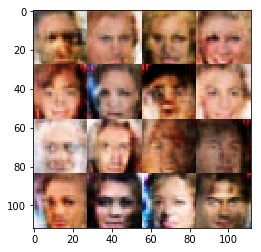

Epoch 1/5... Discriminator Loss: 0.3038... Generator Loss: 1.8164
Epoch 1/5... Discriminator Loss: 0.1759... Generator Loss: 2.6225
Epoch 1/5... Discriminator Loss: 0.7033... Generator Loss: 1.0481
Epoch 1/5... Discriminator Loss: 0.2970... Generator Loss: 1.8862
Epoch 1/5... Discriminator Loss: 1.3113... Generator Loss: 0.3964


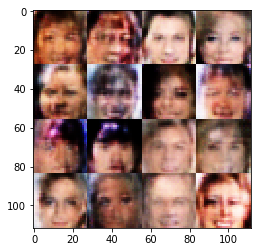

Epoch 1/5... Discriminator Loss: 0.2014... Generator Loss: 2.8449
Epoch 1/5... Discriminator Loss: 0.3814... Generator Loss: 1.4171
Epoch 1/5... Discriminator Loss: 1.3357... Generator Loss: 0.4824
Epoch 1/5... Discriminator Loss: 0.6569... Generator Loss: 2.6646
Epoch 1/5... Discriminator Loss: 0.5160... Generator Loss: 2.2689


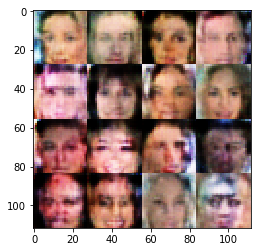

Epoch 1/5... Discriminator Loss: 1.6131... Generator Loss: 1.9656
Epoch 1/5... Discriminator Loss: 1.0610... Generator Loss: 0.9570
Epoch 1/5... Discriminator Loss: 0.4076... Generator Loss: 5.0649
Epoch 1/5... Discriminator Loss: 0.3507... Generator Loss: 1.8664
Epoch 1/5... Discriminator Loss: 0.5754... Generator Loss: 1.1743


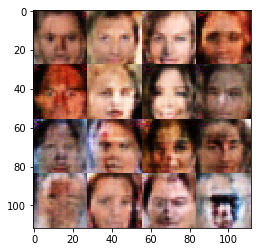

Epoch 1/5... Discriminator Loss: 0.3057... Generator Loss: 1.8447
Epoch 1/5... Discriminator Loss: 0.4709... Generator Loss: 2.0517
Epoch 1/5... Discriminator Loss: 0.3100... Generator Loss: 1.7497
Epoch 1/5... Discriminator Loss: 0.3237... Generator Loss: 2.6912
Epoch 1/5... Discriminator Loss: 0.1769... Generator Loss: 3.2784


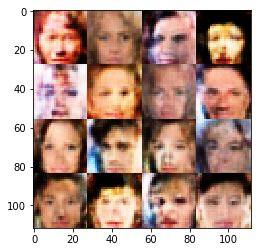

Epoch 1/5... Discriminator Loss: 0.4105... Generator Loss: 1.5604
Epoch 1/5... Discriminator Loss: 0.7062... Generator Loss: 2.6175
Epoch 1/5... Discriminator Loss: 0.4052... Generator Loss: 1.5962
Epoch 1/5... Discriminator Loss: 0.5803... Generator Loss: 1.1075
Epoch 1/5... Discriminator Loss: 2.4873... Generator Loss: 0.1272


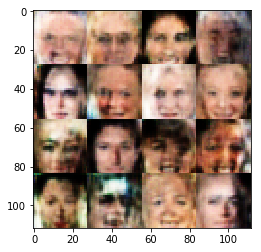

Epoch 1/5... Discriminator Loss: 0.3721... Generator Loss: 2.8446
Epoch 1/5... Discriminator Loss: 0.1955... Generator Loss: 3.4309
Epoch 1/5... Discriminator Loss: 0.2479... Generator Loss: 2.2271
Epoch 1/5... Discriminator Loss: 0.4652... Generator Loss: 5.2665
Epoch 1/5... Discriminator Loss: 0.3707... Generator Loss: 1.7450


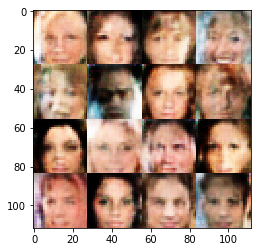

Epoch 1/5... Discriminator Loss: 1.2173... Generator Loss: 1.2450
Epoch 1/5... Discriminator Loss: 0.3059... Generator Loss: 3.8618
Epoch 1/5... Discriminator Loss: 0.2589... Generator Loss: 2.2080
Epoch 1/5... Discriminator Loss: 1.1416... Generator Loss: 0.5818
Epoch 1/5... Discriminator Loss: 0.8991... Generator Loss: 0.8575


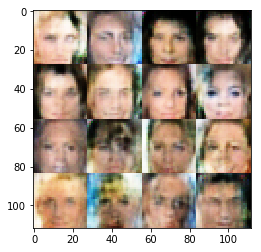

Epoch 1/5... Discriminator Loss: 0.2972... Generator Loss: 2.0186
Epoch 1/5... Discriminator Loss: 0.6757... Generator Loss: 1.0583
Epoch 1/5... Discriminator Loss: 0.4613... Generator Loss: 2.2944
Epoch 1/5... Discriminator Loss: 0.4723... Generator Loss: 2.5179
Epoch 1/5... Discriminator Loss: 0.4606... Generator Loss: 1.8741


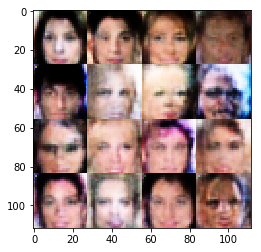

Epoch 1/5... Discriminator Loss: 0.3458... Generator Loss: 2.1913
Epoch 1/5... Discriminator Loss: 0.4092... Generator Loss: 1.3101
Epoch 1/5... Discriminator Loss: 0.6995... Generator Loss: 0.9659
Epoch 1/5... Discriminator Loss: 0.7512... Generator Loss: 1.4622
Epoch 1/5... Discriminator Loss: 0.3225... Generator Loss: 1.9798


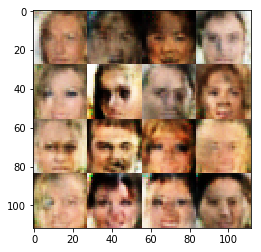

Epoch 1/5... Discriminator Loss: 1.1519... Generator Loss: 0.6151
Epoch 1/5... Discriminator Loss: 0.2333... Generator Loss: 2.1822
Epoch 1/5... Discriminator Loss: 0.4702... Generator Loss: 1.8525
Epoch 1/5... Discriminator Loss: 0.4930... Generator Loss: 3.9090
Epoch 1/5... Discriminator Loss: 1.1204... Generator Loss: 1.4864


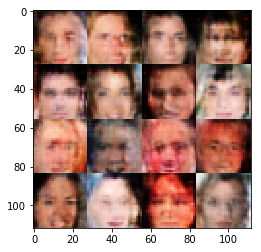

Epoch 1/5... Discriminator Loss: 1.0985... Generator Loss: 0.7973
Epoch 1/5... Discriminator Loss: 1.1024... Generator Loss: 0.6464
Epoch 1/5... Discriminator Loss: 0.8266... Generator Loss: 0.7766
Epoch 1/5... Discriminator Loss: 0.7295... Generator Loss: 1.3294
Epoch 1/5... Discriminator Loss: 0.8359... Generator Loss: 1.1065


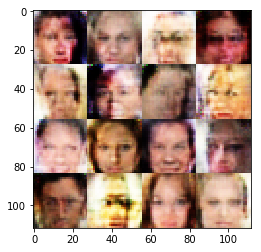

Epoch 1/5... Discriminator Loss: 0.5289... Generator Loss: 2.6799
Epoch 1/5... Discriminator Loss: 0.7225... Generator Loss: 1.4701
Epoch 1/5... Discriminator Loss: 0.6687... Generator Loss: 3.3231
Epoch 1/5... Discriminator Loss: 0.5829... Generator Loss: 1.1452
Epoch 1/5... Discriminator Loss: 0.2135... Generator Loss: 2.4016


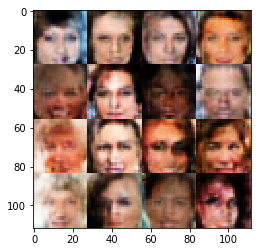

Epoch 1/5... Discriminator Loss: 0.3939... Generator Loss: 2.2736
Epoch 1/5... Discriminator Loss: 0.6270... Generator Loss: 1.0294
Epoch 1/5... Discriminator Loss: 0.5659... Generator Loss: 2.2020
Epoch 1/5... Discriminator Loss: 0.9113... Generator Loss: 0.6697
Epoch 1/5... Discriminator Loss: 0.8328... Generator Loss: 0.6840


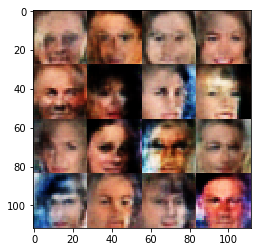

Epoch 1/5... Discriminator Loss: 0.4636... Generator Loss: 3.1100
Epoch 1/5... Discriminator Loss: 0.2745... Generator Loss: 3.3361
Epoch 1/5... Discriminator Loss: 0.2547... Generator Loss: 2.7534
Epoch 1/5... Discriminator Loss: 0.2629... Generator Loss: 2.4356
Epoch 1/5... Discriminator Loss: 0.9933... Generator Loss: 7.1910


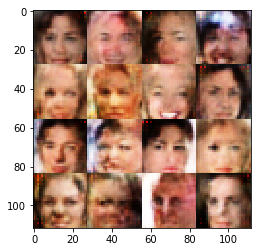

Epoch 1/5... Discriminator Loss: 0.6088... Generator Loss: 1.0961
Epoch 1/5... Discriminator Loss: 0.1605... Generator Loss: 3.4365
Epoch 1/5... Discriminator Loss: 1.0723... Generator Loss: 0.6692
Epoch 1/5... Discriminator Loss: 0.4423... Generator Loss: 2.2909
Epoch 1/5... Discriminator Loss: 0.1806... Generator Loss: 3.5392


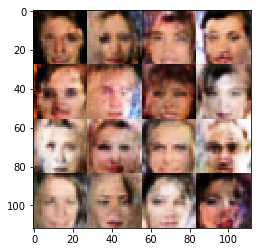

Epoch 1/5... Discriminator Loss: 0.6623... Generator Loss: 1.5635
Epoch 1/5... Discriminator Loss: 0.1527... Generator Loss: 3.2889
Epoch 1/5... Discriminator Loss: 0.0792... Generator Loss: 6.4191
Epoch 1/5... Discriminator Loss: 0.2271... Generator Loss: 2.8711
Epoch 1/5... Discriminator Loss: 0.2176... Generator Loss: 3.6951


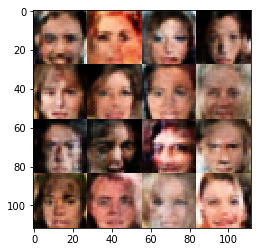

Epoch 1/5... Discriminator Loss: 0.0739... Generator Loss: 5.2204
Epoch 1/5... Discriminator Loss: 0.7519... Generator Loss: 4.3272
Epoch 1/5... Discriminator Loss: 0.4184... Generator Loss: 5.9534
Epoch 1/5... Discriminator Loss: 0.0874... Generator Loss: 3.1567
Epoch 1/5... Discriminator Loss: 0.0624... Generator Loss: 6.1559


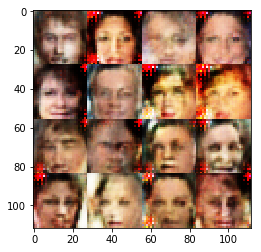

Epoch 1/5... Discriminator Loss: 0.0502... Generator Loss: 4.5481
Epoch 1/5... Discriminator Loss: 0.0697... Generator Loss: 4.4780
Epoch 1/5... Discriminator Loss: 0.0564... Generator Loss: 5.8285
Epoch 1/5... Discriminator Loss: 0.0947... Generator Loss: 3.8905
Epoch 1/5... Discriminator Loss: 0.1626... Generator Loss: 4.8519


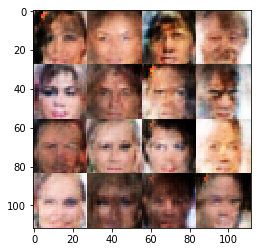

Epoch 1/5... Discriminator Loss: 0.1106... Generator Loss: 3.8142
Epoch 1/5... Discriminator Loss: 0.1106... Generator Loss: 4.0376
Epoch 1/5... Discriminator Loss: 0.5325... Generator Loss: 1.3394
Epoch 1/5... Discriminator Loss: 2.0313... Generator Loss: 0.2279
Epoch 1/5... Discriminator Loss: 0.5422... Generator Loss: 1.9754


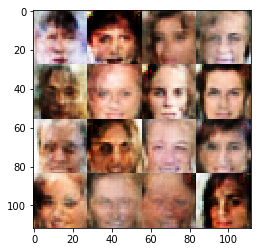

Epoch 1/5... Discriminator Loss: 1.7531... Generator Loss: 7.0521
Epoch 1/5... Discriminator Loss: 0.7638... Generator Loss: 1.0751
Epoch 1/5... Discriminator Loss: 0.7102... Generator Loss: 1.0015
Epoch 1/5... Discriminator Loss: 0.6915... Generator Loss: 1.4232
Epoch 1/5... Discriminator Loss: 0.2172... Generator Loss: 2.3441


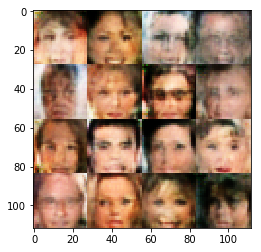

Epoch 1/5... Discriminator Loss: 1.7438... Generator Loss: 0.2615
Epoch 1/5... Discriminator Loss: 0.6866... Generator Loss: 1.2197
Epoch 1/5... Discriminator Loss: 1.9026... Generator Loss: 0.2302
Epoch 1/5... Discriminator Loss: 0.6531... Generator Loss: 0.9277
Epoch 1/5... Discriminator Loss: 0.6591... Generator Loss: 1.0688


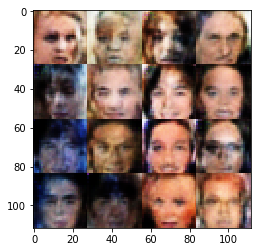

Epoch 1/5... Discriminator Loss: 0.7186... Generator Loss: 1.2351
Epoch 1/5... Discriminator Loss: 0.9497... Generator Loss: 0.7757
Epoch 1/5... Discriminator Loss: 0.3642... Generator Loss: 1.9209
Epoch 1/5... Discriminator Loss: 0.9989... Generator Loss: 0.6280
Epoch 1/5... Discriminator Loss: 0.5134... Generator Loss: 1.1872


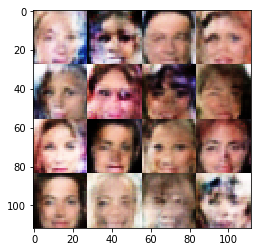

Epoch 1/5... Discriminator Loss: 0.3360... Generator Loss: 2.2307
Epoch 1/5... Discriminator Loss: 0.7610... Generator Loss: 0.8472
Epoch 1/5... Discriminator Loss: 0.9234... Generator Loss: 0.7835
Epoch 1/5... Discriminator Loss: 0.9171... Generator Loss: 0.6991
Epoch 1/5... Discriminator Loss: 0.9094... Generator Loss: 1.1758


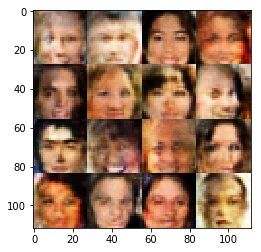

Epoch 1/5... Discriminator Loss: 0.4844... Generator Loss: 4.6358
Epoch 1/5... Discriminator Loss: 0.3497... Generator Loss: 4.7140
Epoch 1/5... Discriminator Loss: 0.2965... Generator Loss: 2.0207
Epoch 1/5... Discriminator Loss: 0.7924... Generator Loss: 2.1221
Epoch 1/5... Discriminator Loss: 1.2231... Generator Loss: 0.4383


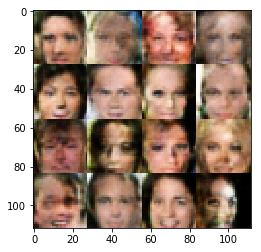

Epoch 1/5... Discriminator Loss: 0.8598... Generator Loss: 5.5561
Epoch 1/5... Discriminator Loss: 0.8097... Generator Loss: 0.8886
Epoch 1/5... Discriminator Loss: 0.4294... Generator Loss: 1.5669
Epoch 1/5... Discriminator Loss: 0.6622... Generator Loss: 1.2526
Epoch 1/5... Discriminator Loss: 0.3986... Generator Loss: 1.7103


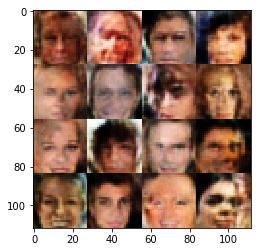

Epoch 1/5... Discriminator Loss: 0.8407... Generator Loss: 1.0437
Epoch 1/5... Discriminator Loss: 0.9111... Generator Loss: 1.7998
Epoch 1/5... Discriminator Loss: 0.7346... Generator Loss: 1.0605
Epoch 1/5... Discriminator Loss: 0.2738... Generator Loss: 2.4436
Epoch 1/5... Discriminator Loss: 0.6831... Generator Loss: 2.7997


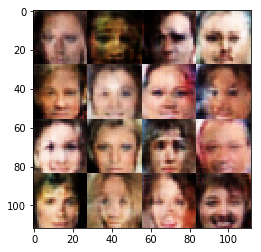

Epoch 1/5... Discriminator Loss: 0.1246... Generator Loss: 3.6714
Epoch 1/5... Discriminator Loss: 0.2075... Generator Loss: 5.5758
Epoch 1/5... Discriminator Loss: 1.1715... Generator Loss: 4.9534
Epoch 1/5... Discriminator Loss: 1.1935... Generator Loss: 3.2810
Epoch 1/5... Discriminator Loss: 0.4139... Generator Loss: 1.3773


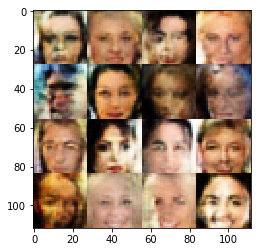

Epoch 1/5... Discriminator Loss: 0.6249... Generator Loss: 2.0420
Epoch 1/5... Discriminator Loss: 0.4474... Generator Loss: 1.3883
Epoch 1/5... Discriminator Loss: 0.5066... Generator Loss: 2.1131
Epoch 1/5... Discriminator Loss: 0.6770... Generator Loss: 1.5579
Epoch 1/5... Discriminator Loss: 0.8765... Generator Loss: 0.7633


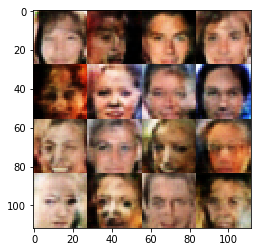

Epoch 1/5... Discriminator Loss: 0.2924... Generator Loss: 2.2618
Epoch 2/5... Discriminator Loss: 2.7452... Generator Loss: 0.0828
Epoch 2/5... Discriminator Loss: 0.5800... Generator Loss: 2.5352
Epoch 2/5... Discriminator Loss: 0.7703... Generator Loss: 1.0140
Epoch 2/5... Discriminator Loss: 0.3686... Generator Loss: 1.6154


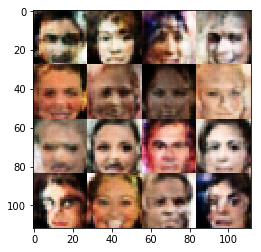

Epoch 2/5... Discriminator Loss: 0.8161... Generator Loss: 0.7428
Epoch 2/5... Discriminator Loss: 0.5159... Generator Loss: 1.2139
Epoch 2/5... Discriminator Loss: 0.2067... Generator Loss: 2.4543
Epoch 2/5... Discriminator Loss: 0.1781... Generator Loss: 2.7966
Epoch 2/5... Discriminator Loss: 0.3091... Generator Loss: 6.3782


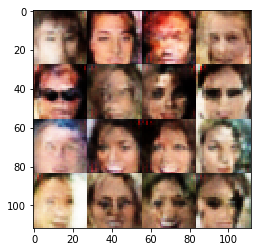

Epoch 2/5... Discriminator Loss: 0.1793... Generator Loss: 3.4905
Epoch 2/5... Discriminator Loss: 0.4318... Generator Loss: 3.2463
Epoch 2/5... Discriminator Loss: 1.7321... Generator Loss: 1.4169
Epoch 2/5... Discriminator Loss: 0.5468... Generator Loss: 4.6515
Epoch 2/5... Discriminator Loss: 0.7021... Generator Loss: 2.6473


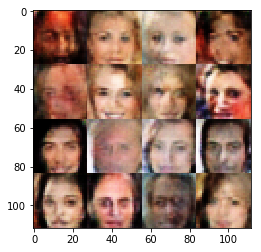

Epoch 2/5... Discriminator Loss: 0.4975... Generator Loss: 1.2850
Epoch 2/5... Discriminator Loss: 0.6130... Generator Loss: 3.0605
Epoch 2/5... Discriminator Loss: 0.2723... Generator Loss: 2.9432
Epoch 2/5... Discriminator Loss: 0.8065... Generator Loss: 0.9212
Epoch 2/5... Discriminator Loss: 0.8278... Generator Loss: 0.8042


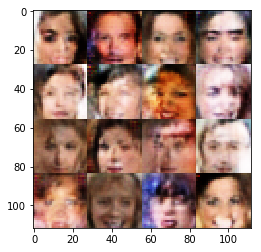

Epoch 2/5... Discriminator Loss: 0.6048... Generator Loss: 1.1074
Epoch 2/5... Discriminator Loss: 0.6231... Generator Loss: 1.4076
Epoch 2/5... Discriminator Loss: 0.6186... Generator Loss: 2.1758
Epoch 2/5... Discriminator Loss: 0.8328... Generator Loss: 3.4282
Epoch 2/5... Discriminator Loss: 0.6812... Generator Loss: 0.9565


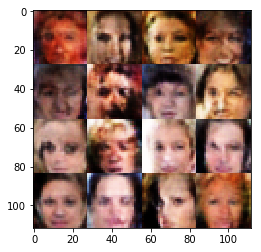

Epoch 2/5... Discriminator Loss: 1.1873... Generator Loss: 2.8881
Epoch 2/5... Discriminator Loss: 0.3983... Generator Loss: 1.5283
Epoch 2/5... Discriminator Loss: 0.6489... Generator Loss: 1.1504
Epoch 2/5... Discriminator Loss: 0.5228... Generator Loss: 1.2585
Epoch 2/5... Discriminator Loss: 1.0639... Generator Loss: 2.5622


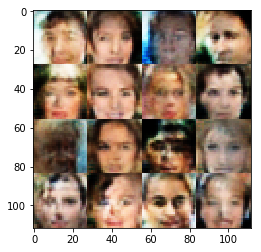

Epoch 2/5... Discriminator Loss: 1.0535... Generator Loss: 0.5932
Epoch 2/5... Discriminator Loss: 0.4850... Generator Loss: 1.4420
Epoch 2/5... Discriminator Loss: 0.3831... Generator Loss: 1.8968
Epoch 2/5... Discriminator Loss: 0.2670... Generator Loss: 4.4398
Epoch 2/5... Discriminator Loss: 0.7683... Generator Loss: 0.7814


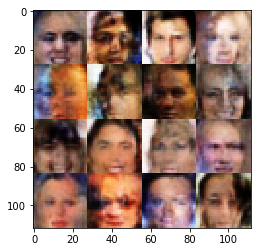

Epoch 2/5... Discriminator Loss: 0.2734... Generator Loss: 2.1868
Epoch 2/5... Discriminator Loss: 1.0119... Generator Loss: 0.5609
Epoch 2/5... Discriminator Loss: 0.2673... Generator Loss: 2.2171
Epoch 2/5... Discriminator Loss: 0.4549... Generator Loss: 1.5060
Epoch 2/5... Discriminator Loss: 0.2352... Generator Loss: 2.4337


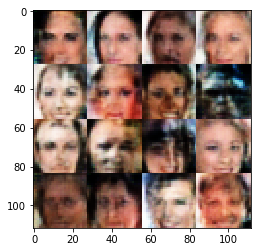

Epoch 2/5... Discriminator Loss: 0.3472... Generator Loss: 2.1940
Epoch 2/5... Discriminator Loss: 1.1080... Generator Loss: 1.5414
Epoch 2/5... Discriminator Loss: 0.4328... Generator Loss: 1.7300
Epoch 2/5... Discriminator Loss: 0.3346... Generator Loss: 1.6420
Epoch 2/5... Discriminator Loss: 0.1347... Generator Loss: 2.7800


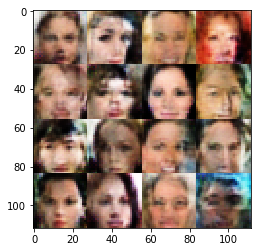

Epoch 2/5... Discriminator Loss: 0.2482... Generator Loss: 1.9219
Epoch 2/5... Discriminator Loss: 1.0531... Generator Loss: 0.6040
Epoch 2/5... Discriminator Loss: 0.6478... Generator Loss: 1.0641
Epoch 2/5... Discriminator Loss: 0.5518... Generator Loss: 1.1597
Epoch 2/5... Discriminator Loss: 1.1388... Generator Loss: 0.5248


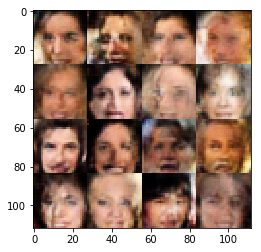

Epoch 2/5... Discriminator Loss: 1.2412... Generator Loss: 0.4519
Epoch 2/5... Discriminator Loss: 2.4269... Generator Loss: 0.1202
Epoch 2/5... Discriminator Loss: 1.0805... Generator Loss: 0.6359
Epoch 2/5... Discriminator Loss: 0.4388... Generator Loss: 1.3719
Epoch 2/5... Discriminator Loss: 0.0885... Generator Loss: 2.9636


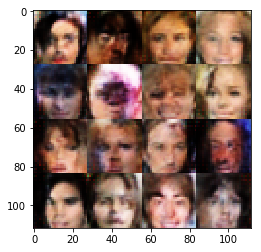

Epoch 2/5... Discriminator Loss: 1.0240... Generator Loss: 0.6036
Epoch 2/5... Discriminator Loss: 0.6529... Generator Loss: 1.5493
Epoch 2/5... Discriminator Loss: 1.3787... Generator Loss: 0.3811
Epoch 2/5... Discriminator Loss: 0.5531... Generator Loss: 1.2951
Epoch 2/5... Discriminator Loss: 0.7488... Generator Loss: 0.7856


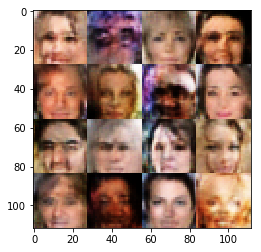

Epoch 2/5... Discriminator Loss: 0.5562... Generator Loss: 1.2839
Epoch 2/5... Discriminator Loss: 0.1703... Generator Loss: 2.6925
Epoch 2/5... Discriminator Loss: 1.2604... Generator Loss: 0.4862
Epoch 2/5... Discriminator Loss: 1.0681... Generator Loss: 0.5745
Epoch 2/5... Discriminator Loss: 0.6879... Generator Loss: 1.2113


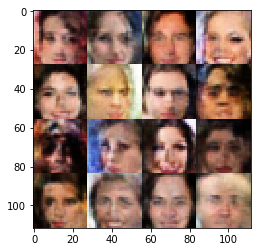

Epoch 2/5... Discriminator Loss: 0.3089... Generator Loss: 2.3641
Epoch 2/5... Discriminator Loss: 0.4547... Generator Loss: 1.6270
Epoch 2/5... Discriminator Loss: 1.1117... Generator Loss: 0.5066
Epoch 2/5... Discriminator Loss: 0.3093... Generator Loss: 2.2259
Epoch 2/5... Discriminator Loss: 0.8368... Generator Loss: 0.8255


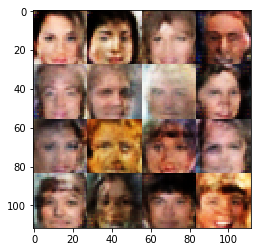

Epoch 2/5... Discriminator Loss: 0.6525... Generator Loss: 1.2104
Epoch 2/5... Discriminator Loss: 0.7249... Generator Loss: 1.9837
Epoch 2/5... Discriminator Loss: 0.2426... Generator Loss: 2.7992
Epoch 2/5... Discriminator Loss: 1.5180... Generator Loss: 0.3319
Epoch 2/5... Discriminator Loss: 0.4121... Generator Loss: 1.4908


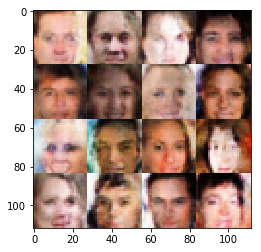

Epoch 2/5... Discriminator Loss: 0.1475... Generator Loss: 3.9269
Epoch 2/5... Discriminator Loss: 0.3325... Generator Loss: 1.8396
Epoch 2/5... Discriminator Loss: 0.3366... Generator Loss: 1.8446
Epoch 2/5... Discriminator Loss: 1.0100... Generator Loss: 0.5895
Epoch 2/5... Discriminator Loss: 0.1617... Generator Loss: 4.2234


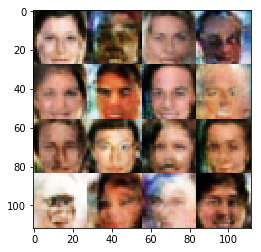

Epoch 2/5... Discriminator Loss: 0.4187... Generator Loss: 1.6412
Epoch 2/5... Discriminator Loss: 0.5788... Generator Loss: 1.5076
Epoch 2/5... Discriminator Loss: 0.8453... Generator Loss: 0.7052
Epoch 2/5... Discriminator Loss: 1.2102... Generator Loss: 3.1135
Epoch 2/5... Discriminator Loss: 0.5437... Generator Loss: 1.3257


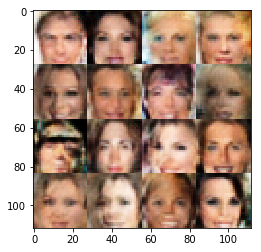

Epoch 2/5... Discriminator Loss: 0.6923... Generator Loss: 3.6605
Epoch 2/5... Discriminator Loss: 0.2946... Generator Loss: 2.4447
Epoch 2/5... Discriminator Loss: 0.1348... Generator Loss: 3.6005
Epoch 2/5... Discriminator Loss: 1.3948... Generator Loss: 0.4187
Epoch 2/5... Discriminator Loss: 0.7306... Generator Loss: 1.0492


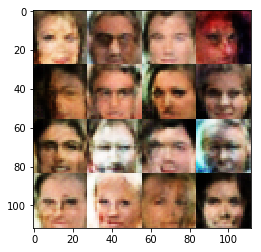

Epoch 2/5... Discriminator Loss: 1.5874... Generator Loss: 0.2895
Epoch 2/5... Discriminator Loss: 1.0265... Generator Loss: 0.5868
Epoch 2/5... Discriminator Loss: 0.6913... Generator Loss: 0.9816
Epoch 2/5... Discriminator Loss: 0.5569... Generator Loss: 1.3512
Epoch 2/5... Discriminator Loss: 1.9743... Generator Loss: 0.2498


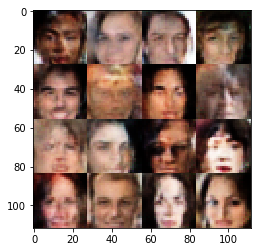

Epoch 2/5... Discriminator Loss: 0.8236... Generator Loss: 0.9554
Epoch 2/5... Discriminator Loss: 1.9402... Generator Loss: 0.2312
Epoch 2/5... Discriminator Loss: 0.8184... Generator Loss: 0.9101
Epoch 2/5... Discriminator Loss: 1.8120... Generator Loss: 0.2506
Epoch 2/5... Discriminator Loss: 0.9703... Generator Loss: 0.7072


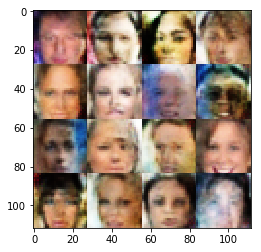

Epoch 2/5... Discriminator Loss: 0.9085... Generator Loss: 0.7419
Epoch 2/5... Discriminator Loss: 0.6696... Generator Loss: 1.0839
Epoch 2/5... Discriminator Loss: 1.1609... Generator Loss: 0.5784
Epoch 2/5... Discriminator Loss: 0.4805... Generator Loss: 1.4545
Epoch 2/5... Discriminator Loss: 0.5588... Generator Loss: 1.7260


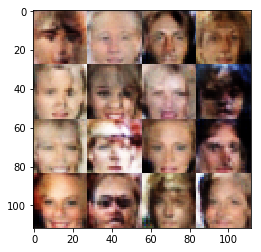

Epoch 2/5... Discriminator Loss: 0.5762... Generator Loss: 1.9322
Epoch 2/5... Discriminator Loss: 0.3445... Generator Loss: 2.0647
Epoch 2/5... Discriminator Loss: 1.6422... Generator Loss: 0.3642
Epoch 2/5... Discriminator Loss: 0.7283... Generator Loss: 1.2413
Epoch 2/5... Discriminator Loss: 0.6098... Generator Loss: 1.7918


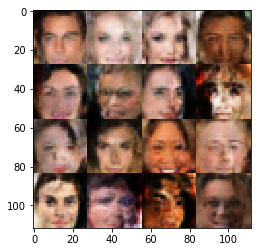

Epoch 2/5... Discriminator Loss: 1.0562... Generator Loss: 0.6154
Epoch 2/5... Discriminator Loss: 0.0529... Generator Loss: 4.1126
Epoch 2/5... Discriminator Loss: 0.3672... Generator Loss: 1.6335
Epoch 2/5... Discriminator Loss: 0.5972... Generator Loss: 1.1371
Epoch 2/5... Discriminator Loss: 0.1258... Generator Loss: 2.6895


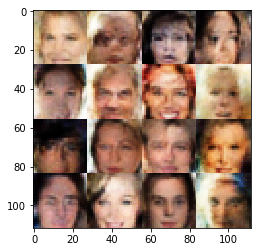

Epoch 2/5... Discriminator Loss: 0.6768... Generator Loss: 0.9358
Epoch 2/5... Discriminator Loss: 1.5631... Generator Loss: 0.2954
Epoch 2/5... Discriminator Loss: 0.2233... Generator Loss: 2.2995
Epoch 2/5... Discriminator Loss: 0.2833... Generator Loss: 1.8698
Epoch 2/5... Discriminator Loss: 1.6064... Generator Loss: 0.2792


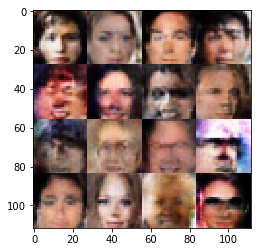

Epoch 2/5... Discriminator Loss: 0.1031... Generator Loss: 5.2493
Epoch 2/5... Discriminator Loss: 0.3271... Generator Loss: 1.9542
Epoch 2/5... Discriminator Loss: 0.3053... Generator Loss: 2.3788
Epoch 2/5... Discriminator Loss: 1.0494... Generator Loss: 2.8539
Epoch 2/5... Discriminator Loss: 1.4043... Generator Loss: 2.5842


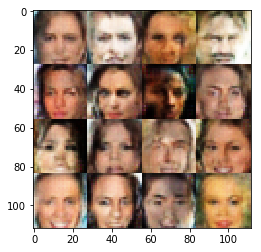

Epoch 2/5... Discriminator Loss: 0.8526... Generator Loss: 0.9172
Epoch 2/5... Discriminator Loss: 0.9387... Generator Loss: 0.7044
Epoch 2/5... Discriminator Loss: 0.9689... Generator Loss: 0.7233
Epoch 2/5... Discriminator Loss: 1.2123... Generator Loss: 0.4787
Epoch 2/5... Discriminator Loss: 0.2082... Generator Loss: 5.9859


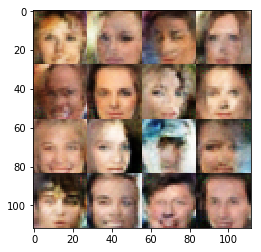

Epoch 2/5... Discriminator Loss: 0.4065... Generator Loss: 1.4258
Epoch 2/5... Discriminator Loss: 0.7030... Generator Loss: 1.5931
Epoch 2/5... Discriminator Loss: 0.5325... Generator Loss: 1.3009
Epoch 2/5... Discriminator Loss: 1.9600... Generator Loss: 0.2226
Epoch 2/5... Discriminator Loss: 0.7065... Generator Loss: 1.0884


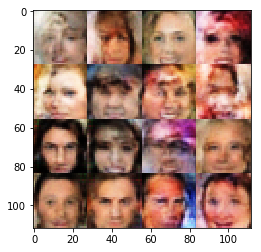

Epoch 2/5... Discriminator Loss: 1.2739... Generator Loss: 0.4752
Epoch 2/5... Discriminator Loss: 1.3845... Generator Loss: 3.2608
Epoch 2/5... Discriminator Loss: 0.6568... Generator Loss: 1.3269
Epoch 2/5... Discriminator Loss: 0.6266... Generator Loss: 1.2915
Epoch 2/5... Discriminator Loss: 1.0811... Generator Loss: 0.5861


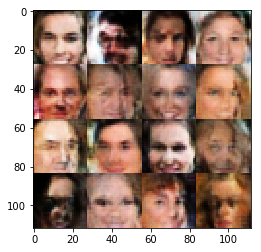

Epoch 2/5... Discriminator Loss: 0.3994... Generator Loss: 1.4520
Epoch 2/5... Discriminator Loss: 1.5473... Generator Loss: 0.2962
Epoch 2/5... Discriminator Loss: 0.9132... Generator Loss: 0.9060
Epoch 2/5... Discriminator Loss: 1.1965... Generator Loss: 0.5136
Epoch 2/5... Discriminator Loss: 1.0218... Generator Loss: 1.3029


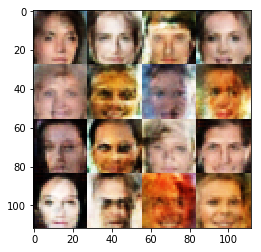

Epoch 2/5... Discriminator Loss: 1.4881... Generator Loss: 0.3787
Epoch 2/5... Discriminator Loss: 0.6343... Generator Loss: 1.7597
Epoch 2/5... Discriminator Loss: 0.3618... Generator Loss: 2.5298
Epoch 2/5... Discriminator Loss: 0.8474... Generator Loss: 0.7397
Epoch 2/5... Discriminator Loss: 1.5755... Generator Loss: 0.2920


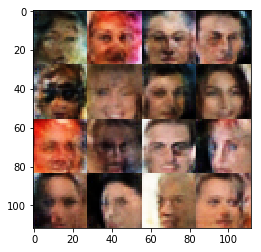

Epoch 2/5... Discriminator Loss: 0.6278... Generator Loss: 1.1938
Epoch 2/5... Discriminator Loss: 1.1970... Generator Loss: 0.4789
Epoch 2/5... Discriminator Loss: 0.8298... Generator Loss: 0.7998
Epoch 2/5... Discriminator Loss: 0.3439... Generator Loss: 1.6796
Epoch 2/5... Discriminator Loss: 0.2409... Generator Loss: 2.6103


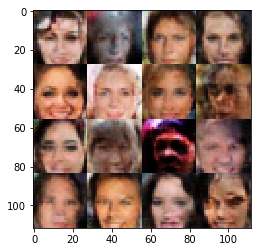

Epoch 2/5... Discriminator Loss: 0.2202... Generator Loss: 2.7465
Epoch 2/5... Discriminator Loss: 1.0427... Generator Loss: 0.6444
Epoch 2/5... Discriminator Loss: 0.2244... Generator Loss: 2.5533
Epoch 2/5... Discriminator Loss: 0.5616... Generator Loss: 1.4508
Epoch 2/5... Discriminator Loss: 1.1501... Generator Loss: 0.6618


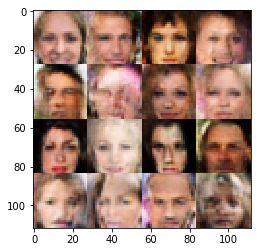

Epoch 2/5... Discriminator Loss: 0.2512... Generator Loss: 2.0856
Epoch 2/5... Discriminator Loss: 0.8796... Generator Loss: 0.8511
Epoch 2/5... Discriminator Loss: 0.6497... Generator Loss: 1.8428
Epoch 2/5... Discriminator Loss: 0.3145... Generator Loss: 1.6543
Epoch 2/5... Discriminator Loss: 0.5271... Generator Loss: 1.5021


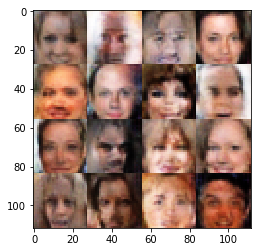

Epoch 2/5... Discriminator Loss: 0.5360... Generator Loss: 1.8836
Epoch 2/5... Discriminator Loss: 0.8568... Generator Loss: 0.7648
Epoch 2/5... Discriminator Loss: 1.8996... Generator Loss: 0.2160
Epoch 2/5... Discriminator Loss: 2.0772... Generator Loss: 0.1706
Epoch 2/5... Discriminator Loss: 0.3518... Generator Loss: 1.6390


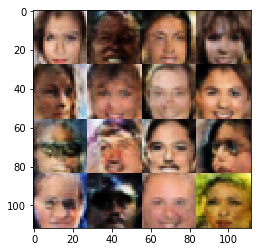

Epoch 2/5... Discriminator Loss: 1.5848... Generator Loss: 0.3452
Epoch 2/5... Discriminator Loss: 0.6886... Generator Loss: 1.0473
Epoch 2/5... Discriminator Loss: 0.8585... Generator Loss: 0.8053
Epoch 2/5... Discriminator Loss: 0.8240... Generator Loss: 0.9819
Epoch 2/5... Discriminator Loss: 0.6152... Generator Loss: 2.3253


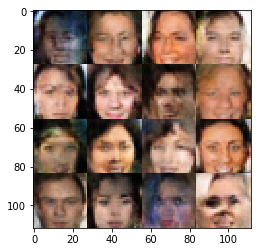

Epoch 2/5... Discriminator Loss: 0.6401... Generator Loss: 1.6264
Epoch 2/5... Discriminator Loss: 1.0949... Generator Loss: 0.5926
Epoch 2/5... Discriminator Loss: 1.1376... Generator Loss: 0.5901
Epoch 2/5... Discriminator Loss: 0.5838... Generator Loss: 1.6424
Epoch 2/5... Discriminator Loss: 1.2468... Generator Loss: 0.5357


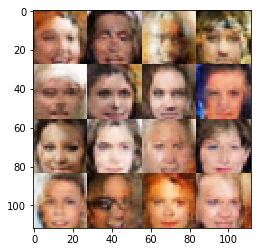

Epoch 2/5... Discriminator Loss: 1.3208... Generator Loss: 0.4260
Epoch 2/5... Discriminator Loss: 0.4622... Generator Loss: 1.8499
Epoch 2/5... Discriminator Loss: 0.6394... Generator Loss: 1.2548
Epoch 2/5... Discriminator Loss: 0.1903... Generator Loss: 3.9053
Epoch 2/5... Discriminator Loss: 1.4445... Generator Loss: 0.4219


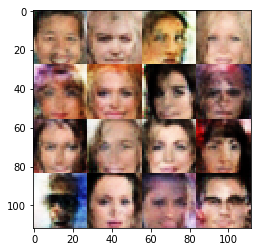

Epoch 2/5... Discriminator Loss: 0.6731... Generator Loss: 1.0132
Epoch 2/5... Discriminator Loss: 0.6166... Generator Loss: 0.9862
Epoch 2/5... Discriminator Loss: 0.7055... Generator Loss: 0.9617
Epoch 2/5... Discriminator Loss: 0.3367... Generator Loss: 1.8182
Epoch 2/5... Discriminator Loss: 0.5401... Generator Loss: 1.0913


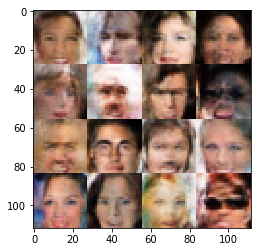

Epoch 2/5... Discriminator Loss: 0.8609... Generator Loss: 0.9648
Epoch 2/5... Discriminator Loss: 1.1054... Generator Loss: 0.5654
Epoch 2/5... Discriminator Loss: 0.9636... Generator Loss: 0.7234
Epoch 2/5... Discriminator Loss: 0.5344... Generator Loss: 1.3909
Epoch 2/5... Discriminator Loss: 0.2713... Generator Loss: 3.9987


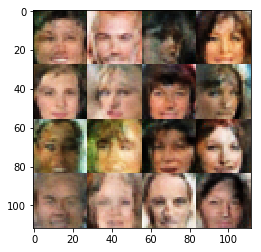

Epoch 2/5... Discriminator Loss: 0.9295... Generator Loss: 0.6850
Epoch 2/5... Discriminator Loss: 0.5838... Generator Loss: 2.7756
Epoch 2/5... Discriminator Loss: 1.1788... Generator Loss: 0.5079
Epoch 2/5... Discriminator Loss: 0.7880... Generator Loss: 4.8942
Epoch 2/5... Discriminator Loss: 1.1479... Generator Loss: 0.5827


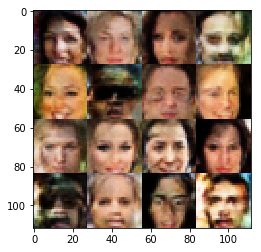

Epoch 2/5... Discriminator Loss: 1.8787... Generator Loss: 0.2393
Epoch 2/5... Discriminator Loss: 1.1106... Generator Loss: 0.4928
Epoch 2/5... Discriminator Loss: 0.7636... Generator Loss: 1.1984
Epoch 2/5... Discriminator Loss: 1.0813... Generator Loss: 0.6679
Epoch 2/5... Discriminator Loss: 0.2638... Generator Loss: 2.7130


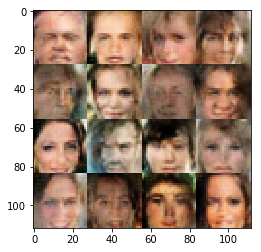

Epoch 2/5... Discriminator Loss: 0.6732... Generator Loss: 1.2074
Epoch 2/5... Discriminator Loss: 0.3015... Generator Loss: 1.9425
Epoch 2/5... Discriminator Loss: 1.3927... Generator Loss: 0.5231
Epoch 2/5... Discriminator Loss: 0.9948... Generator Loss: 0.6961
Epoch 2/5... Discriminator Loss: 0.6765... Generator Loss: 0.9393


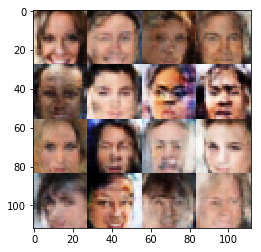

Epoch 2/5... Discriminator Loss: 0.9634... Generator Loss: 1.0124
Epoch 2/5... Discriminator Loss: 0.5960... Generator Loss: 1.5283
Epoch 2/5... Discriminator Loss: 0.4431... Generator Loss: 1.4743
Epoch 2/5... Discriminator Loss: 1.0514... Generator Loss: 0.6172
Epoch 2/5... Discriminator Loss: 0.7449... Generator Loss: 1.1350


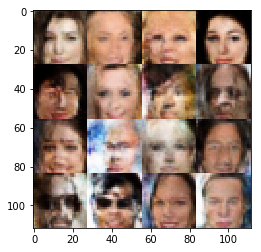

Epoch 2/5... Discriminator Loss: 0.7681... Generator Loss: 1.7998
Epoch 2/5... Discriminator Loss: 0.3730... Generator Loss: 2.1481
Epoch 2/5... Discriminator Loss: 0.8974... Generator Loss: 1.1647
Epoch 2/5... Discriminator Loss: 0.4071... Generator Loss: 1.6476
Epoch 2/5... Discriminator Loss: 0.7474... Generator Loss: 0.9036


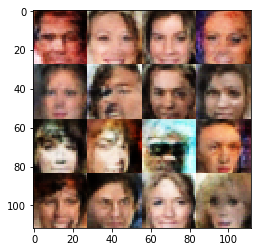

Epoch 2/5... Discriminator Loss: 1.0465... Generator Loss: 1.3495
Epoch 2/5... Discriminator Loss: 0.9368... Generator Loss: 0.7619
Epoch 2/5... Discriminator Loss: 1.0131... Generator Loss: 0.6096
Epoch 2/5... Discriminator Loss: 0.9294... Generator Loss: 1.0279
Epoch 2/5... Discriminator Loss: 0.2756... Generator Loss: 2.0634


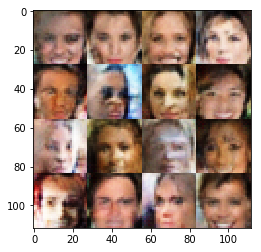

Epoch 2/5... Discriminator Loss: 0.3089... Generator Loss: 1.8901
Epoch 2/5... Discriminator Loss: 0.5574... Generator Loss: 2.2301
Epoch 2/5... Discriminator Loss: 0.7087... Generator Loss: 1.7161
Epoch 2/5... Discriminator Loss: 0.3019... Generator Loss: 1.8123
Epoch 2/5... Discriminator Loss: 0.7316... Generator Loss: 2.3992


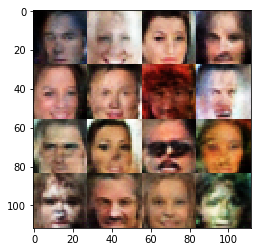

Epoch 2/5... Discriminator Loss: 0.6288... Generator Loss: 1.8090
Epoch 2/5... Discriminator Loss: 0.7645... Generator Loss: 1.8107
Epoch 2/5... Discriminator Loss: 1.3904... Generator Loss: 1.3726
Epoch 2/5... Discriminator Loss: 0.5892... Generator Loss: 1.2593
Epoch 2/5... Discriminator Loss: 0.2421... Generator Loss: 2.1029


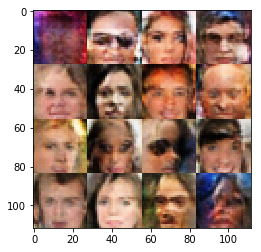

Epoch 2/5... Discriminator Loss: 0.7272... Generator Loss: 2.2487
Epoch 2/5... Discriminator Loss: 0.4391... Generator Loss: 1.4936
Epoch 2/5... Discriminator Loss: 0.4205... Generator Loss: 2.0551
Epoch 2/5... Discriminator Loss: 0.6842... Generator Loss: 0.9870
Epoch 2/5... Discriminator Loss: 1.5732... Generator Loss: 0.3015


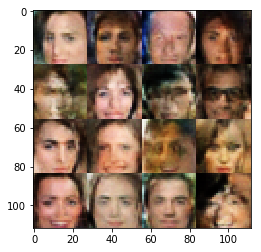

Epoch 2/5... Discriminator Loss: 0.1405... Generator Loss: 5.7351
Epoch 2/5... Discriminator Loss: 1.1379... Generator Loss: 4.1345
Epoch 2/5... Discriminator Loss: 1.2419... Generator Loss: 0.5474
Epoch 2/5... Discriminator Loss: 0.4137... Generator Loss: 2.1886
Epoch 2/5... Discriminator Loss: 0.8776... Generator Loss: 3.0520


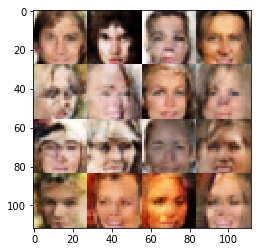

Epoch 2/5... Discriminator Loss: 0.9685... Generator Loss: 0.7523
Epoch 2/5... Discriminator Loss: 1.3257... Generator Loss: 0.5368
Epoch 2/5... Discriminator Loss: 0.9382... Generator Loss: 0.8646
Epoch 2/5... Discriminator Loss: 0.6745... Generator Loss: 1.3267
Epoch 2/5... Discriminator Loss: 0.7913... Generator Loss: 0.8111


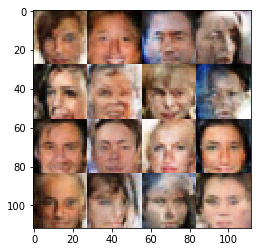

Epoch 2/5... Discriminator Loss: 0.5522... Generator Loss: 1.2742
Epoch 2/5... Discriminator Loss: 0.3688... Generator Loss: 1.5588
Epoch 2/5... Discriminator Loss: 0.9228... Generator Loss: 0.6823
Epoch 2/5... Discriminator Loss: 0.9336... Generator Loss: 0.7048
Epoch 2/5... Discriminator Loss: 0.8657... Generator Loss: 0.9225


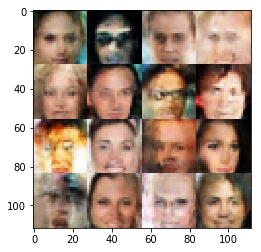

Epoch 2/5... Discriminator Loss: 1.6190... Generator Loss: 0.3319
Epoch 2/5... Discriminator Loss: 0.5888... Generator Loss: 2.4056
Epoch 2/5... Discriminator Loss: 0.4462... Generator Loss: 1.4655
Epoch 2/5... Discriminator Loss: 1.0484... Generator Loss: 0.6520
Epoch 2/5... Discriminator Loss: 1.3257... Generator Loss: 0.4013


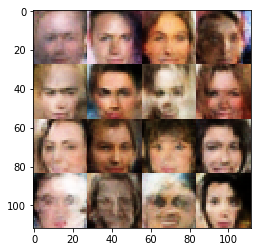

Epoch 2/5... Discriminator Loss: 0.6828... Generator Loss: 0.8827
Epoch 2/5... Discriminator Loss: 0.6956... Generator Loss: 1.0065
Epoch 2/5... Discriminator Loss: 0.3703... Generator Loss: 2.0363
Epoch 2/5... Discriminator Loss: 0.7534... Generator Loss: 1.8458
Epoch 2/5... Discriminator Loss: 0.0890... Generator Loss: 4.0971


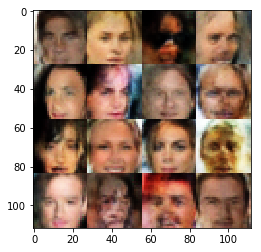

Epoch 2/5... Discriminator Loss: 0.5664... Generator Loss: 1.1825
Epoch 2/5... Discriminator Loss: 0.5141... Generator Loss: 1.2989
Epoch 2/5... Discriminator Loss: 0.8816... Generator Loss: 0.6982
Epoch 2/5... Discriminator Loss: 1.2001... Generator Loss: 0.4943
Epoch 2/5... Discriminator Loss: 1.2404... Generator Loss: 3.4403


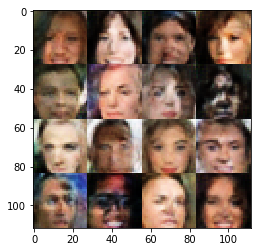

Epoch 2/5... Discriminator Loss: 1.3118... Generator Loss: 0.4612
Epoch 2/5... Discriminator Loss: 0.7709... Generator Loss: 0.9258
Epoch 2/5... Discriminator Loss: 0.9817... Generator Loss: 0.7224
Epoch 2/5... Discriminator Loss: 2.3142... Generator Loss: 0.1497
Epoch 2/5... Discriminator Loss: 0.4791... Generator Loss: 1.2030


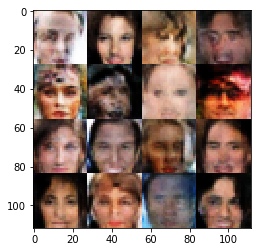

Epoch 2/5... Discriminator Loss: 0.2195... Generator Loss: 2.2747
Epoch 2/5... Discriminator Loss: 0.4717... Generator Loss: 1.3343
Epoch 2/5... Discriminator Loss: 2.0483... Generator Loss: 0.1697
Epoch 2/5... Discriminator Loss: 3.2644... Generator Loss: 0.0546
Epoch 2/5... Discriminator Loss: 0.9584... Generator Loss: 0.6699


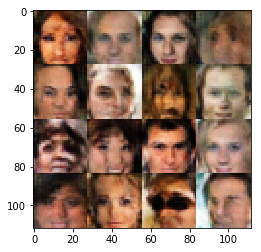

Epoch 2/5... Discriminator Loss: 0.7030... Generator Loss: 1.0178
Epoch 2/5... Discriminator Loss: 2.1308... Generator Loss: 0.1807
Epoch 2/5... Discriminator Loss: 1.5421... Generator Loss: 0.2932
Epoch 2/5... Discriminator Loss: 0.7196... Generator Loss: 0.9623
Epoch 2/5... Discriminator Loss: 0.5485... Generator Loss: 1.0835


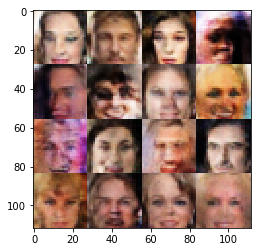

Epoch 2/5... Discriminator Loss: 0.9769... Generator Loss: 0.6248
Epoch 2/5... Discriminator Loss: 0.3420... Generator Loss: 1.8730
Epoch 2/5... Discriminator Loss: 0.5759... Generator Loss: 1.6626
Epoch 2/5... Discriminator Loss: 2.2826... Generator Loss: 0.1410
Epoch 2/5... Discriminator Loss: 0.4616... Generator Loss: 1.5821


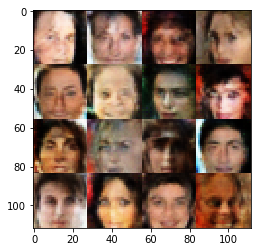

Epoch 2/5... Discriminator Loss: 0.3439... Generator Loss: 2.1070
Epoch 2/5... Discriminator Loss: 1.7049... Generator Loss: 0.2754
Epoch 2/5... Discriminator Loss: 0.6349... Generator Loss: 1.0997
Epoch 2/5... Discriminator Loss: 0.6351... Generator Loss: 1.5570
Epoch 2/5... Discriminator Loss: 0.7729... Generator Loss: 1.2586


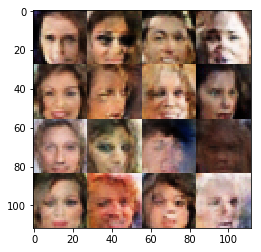

Epoch 2/5... Discriminator Loss: 0.5793... Generator Loss: 1.3932
Epoch 2/5... Discriminator Loss: 0.5240... Generator Loss: 1.2511
Epoch 2/5... Discriminator Loss: 0.9221... Generator Loss: 3.5877
Epoch 2/5... Discriminator Loss: 1.6993... Generator Loss: 0.2697
Epoch 2/5... Discriminator Loss: 0.4319... Generator Loss: 1.6386


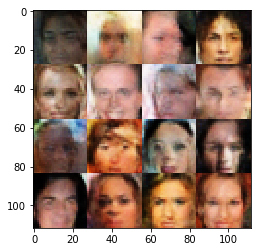

Epoch 2/5... Discriminator Loss: 0.6170... Generator Loss: 1.2426
Epoch 2/5... Discriminator Loss: 1.1237... Generator Loss: 0.6887
Epoch 2/5... Discriminator Loss: 0.3228... Generator Loss: 1.9423
Epoch 2/5... Discriminator Loss: 0.1068... Generator Loss: 4.9250
Epoch 2/5... Discriminator Loss: 0.6182... Generator Loss: 1.6740


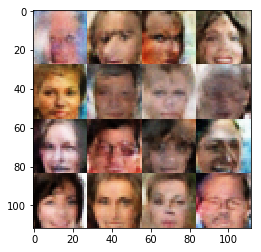

Epoch 2/5... Discriminator Loss: 1.2744... Generator Loss: 0.4250
Epoch 2/5... Discriminator Loss: 1.5875... Generator Loss: 0.3266
Epoch 2/5... Discriminator Loss: 0.2241... Generator Loss: 2.0878
Epoch 2/5... Discriminator Loss: 0.2064... Generator Loss: 2.0948
Epoch 2/5... Discriminator Loss: 1.0960... Generator Loss: 1.0867


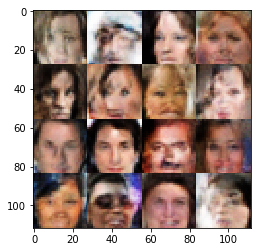

Epoch 2/5... Discriminator Loss: 0.6915... Generator Loss: 1.7408
Epoch 2/5... Discriminator Loss: 0.5981... Generator Loss: 1.1152
Epoch 2/5... Discriminator Loss: 0.4293... Generator Loss: 1.5570
Epoch 2/5... Discriminator Loss: 0.7615... Generator Loss: 0.9475
Epoch 2/5... Discriminator Loss: 1.0842... Generator Loss: 0.5704


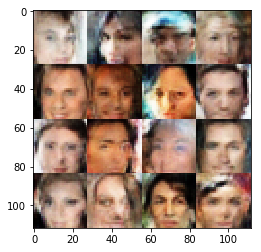

Epoch 2/5... Discriminator Loss: 0.9962... Generator Loss: 0.6074
Epoch 2/5... Discriminator Loss: 0.3657... Generator Loss: 1.7125
Epoch 2/5... Discriminator Loss: 1.4292... Generator Loss: 0.3754
Epoch 3/5... Discriminator Loss: 0.3002... Generator Loss: 3.1348
Epoch 3/5... Discriminator Loss: 0.2217... Generator Loss: 3.0697


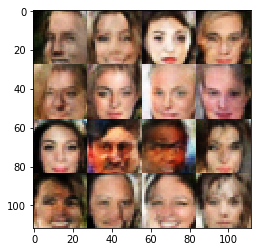

Epoch 3/5... Discriminator Loss: 1.2229... Generator Loss: 2.2227
Epoch 3/5... Discriminator Loss: 1.0232... Generator Loss: 1.0772
Epoch 3/5... Discriminator Loss: 0.4637... Generator Loss: 1.7768
Epoch 3/5... Discriminator Loss: 0.8631... Generator Loss: 0.8065
Epoch 3/5... Discriminator Loss: 0.5385... Generator Loss: 1.1431


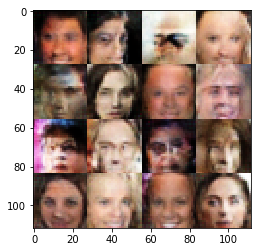

Epoch 3/5... Discriminator Loss: 0.7898... Generator Loss: 0.8865
Epoch 3/5... Discriminator Loss: 1.5184... Generator Loss: 0.3188
Epoch 3/5... Discriminator Loss: 0.8760... Generator Loss: 1.3651
Epoch 3/5... Discriminator Loss: 0.3894... Generator Loss: 2.2920
Epoch 3/5... Discriminator Loss: 1.2079... Generator Loss: 0.5553


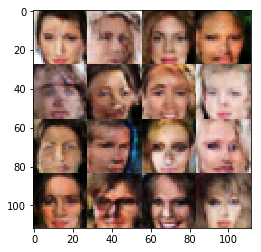

Epoch 3/5... Discriminator Loss: 0.6900... Generator Loss: 1.1518
Epoch 3/5... Discriminator Loss: 0.7150... Generator Loss: 1.4953
Epoch 3/5... Discriminator Loss: 0.5323... Generator Loss: 1.3248
Epoch 3/5... Discriminator Loss: 1.0380... Generator Loss: 0.7436
Epoch 3/5... Discriminator Loss: 0.5832... Generator Loss: 1.1340


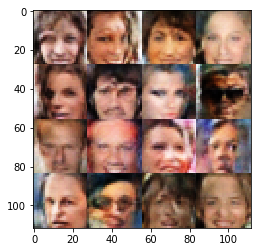

Epoch 3/5... Discriminator Loss: 0.7300... Generator Loss: 0.9318
Epoch 3/5... Discriminator Loss: 0.6192... Generator Loss: 1.7349
Epoch 3/5... Discriminator Loss: 1.1448... Generator Loss: 0.5871
Epoch 3/5... Discriminator Loss: 1.0870... Generator Loss: 0.6825
Epoch 3/5... Discriminator Loss: 1.7277... Generator Loss: 2.3311


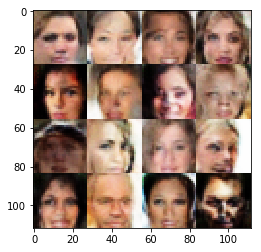

Epoch 3/5... Discriminator Loss: 0.4204... Generator Loss: 2.1877
Epoch 3/5... Discriminator Loss: 0.9602... Generator Loss: 0.6492
Epoch 3/5... Discriminator Loss: 0.5129... Generator Loss: 1.1353
Epoch 3/5... Discriminator Loss: 0.6128... Generator Loss: 1.1956
Epoch 3/5... Discriminator Loss: 0.5778... Generator Loss: 1.1580


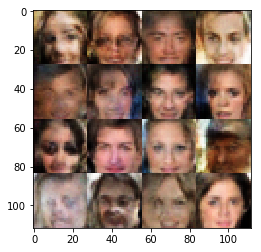

Epoch 3/5... Discriminator Loss: 0.6800... Generator Loss: 1.0219
Epoch 3/5... Discriminator Loss: 0.4170... Generator Loss: 1.7804
Epoch 3/5... Discriminator Loss: 0.4363... Generator Loss: 1.7621
Epoch 3/5... Discriminator Loss: 0.7664... Generator Loss: 1.1939
Epoch 3/5... Discriminator Loss: 0.6643... Generator Loss: 3.7568


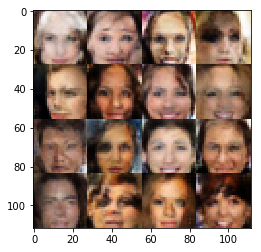

Epoch 3/5... Discriminator Loss: 0.9205... Generator Loss: 0.7363
Epoch 3/5... Discriminator Loss: 1.6359... Generator Loss: 0.2961
Epoch 3/5... Discriminator Loss: 0.4853... Generator Loss: 1.4314
Epoch 3/5... Discriminator Loss: 0.9836... Generator Loss: 0.6644
Epoch 3/5... Discriminator Loss: 0.4297... Generator Loss: 5.5930


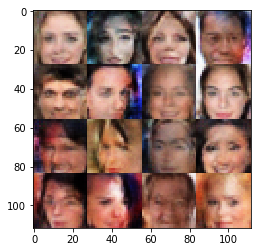

Epoch 3/5... Discriminator Loss: 0.2217... Generator Loss: 4.0101
Epoch 3/5... Discriminator Loss: 1.8992... Generator Loss: 0.2748
Epoch 3/5... Discriminator Loss: 1.0014... Generator Loss: 0.6636
Epoch 3/5... Discriminator Loss: 0.7064... Generator Loss: 0.9312
Epoch 3/5... Discriminator Loss: 0.5007... Generator Loss: 1.4937


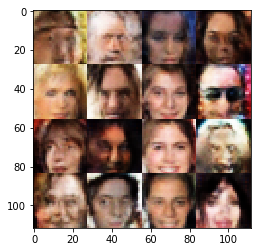

Epoch 3/5... Discriminator Loss: 0.5915... Generator Loss: 1.2803
Epoch 3/5... Discriminator Loss: 1.5429... Generator Loss: 0.3144
Epoch 3/5... Discriminator Loss: 0.7450... Generator Loss: 1.0982
Epoch 3/5... Discriminator Loss: 0.9475... Generator Loss: 0.6604
Epoch 3/5... Discriminator Loss: 0.8487... Generator Loss: 0.7467


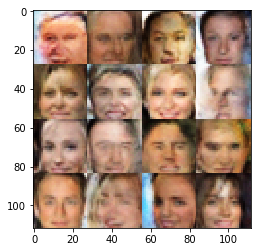

Epoch 3/5... Discriminator Loss: 1.2064... Generator Loss: 0.4475
Epoch 3/5... Discriminator Loss: 1.0928... Generator Loss: 0.6479
Epoch 3/5... Discriminator Loss: 0.5811... Generator Loss: 1.5332
Epoch 3/5... Discriminator Loss: 0.7328... Generator Loss: 0.9214
Epoch 3/5... Discriminator Loss: 0.1086... Generator Loss: 3.9499


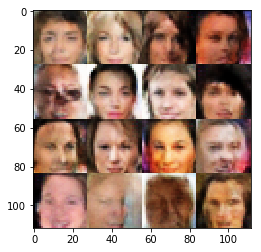

Epoch 3/5... Discriminator Loss: 0.8087... Generator Loss: 1.0591
Epoch 3/5... Discriminator Loss: 1.3036... Generator Loss: 0.5421
Epoch 3/5... Discriminator Loss: 2.4933... Generator Loss: 0.1130
Epoch 3/5... Discriminator Loss: 0.6969... Generator Loss: 1.5423
Epoch 3/5... Discriminator Loss: 1.3496... Generator Loss: 0.3813


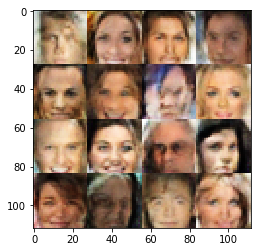

Epoch 3/5... Discriminator Loss: 1.1275... Generator Loss: 0.6097
Epoch 3/5... Discriminator Loss: 1.0045... Generator Loss: 0.7785
Epoch 3/5... Discriminator Loss: 1.1520... Generator Loss: 0.5269
Epoch 3/5... Discriminator Loss: 1.1462... Generator Loss: 0.4981
Epoch 3/5... Discriminator Loss: 0.3463... Generator Loss: 1.8018


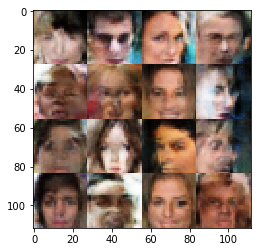

Epoch 3/5... Discriminator Loss: 0.7891... Generator Loss: 1.0293
Epoch 3/5... Discriminator Loss: 1.1138... Generator Loss: 2.2267
Epoch 3/5... Discriminator Loss: 0.9465... Generator Loss: 0.7239
Epoch 3/5... Discriminator Loss: 0.7150... Generator Loss: 1.1930
Epoch 3/5... Discriminator Loss: 2.0325... Generator Loss: 0.1714


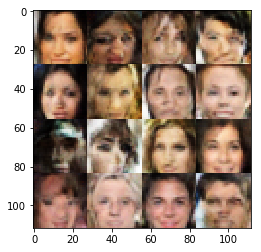

Epoch 3/5... Discriminator Loss: 1.3185... Generator Loss: 0.4551
Epoch 3/5... Discriminator Loss: 1.1530... Generator Loss: 0.5458
Epoch 3/5... Discriminator Loss: 0.9086... Generator Loss: 0.7635
Epoch 3/5... Discriminator Loss: 0.6689... Generator Loss: 1.4850
Epoch 3/5... Discriminator Loss: 0.7956... Generator Loss: 0.9076


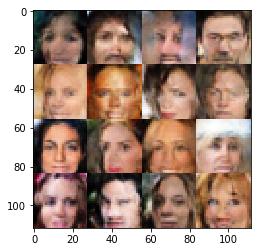

Epoch 3/5... Discriminator Loss: 0.6072... Generator Loss: 1.0948
Epoch 3/5... Discriminator Loss: 0.7555... Generator Loss: 1.0289
Epoch 3/5... Discriminator Loss: 0.4921... Generator Loss: 1.4186
Epoch 3/5... Discriminator Loss: 0.2610... Generator Loss: 3.6747
Epoch 3/5... Discriminator Loss: 0.5263... Generator Loss: 1.3054


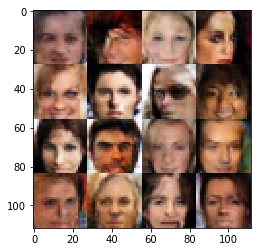

Epoch 3/5... Discriminator Loss: 1.0317... Generator Loss: 0.6155
Epoch 3/5... Discriminator Loss: 0.7493... Generator Loss: 0.7829
Epoch 3/5... Discriminator Loss: 0.9154... Generator Loss: 0.7572
Epoch 3/5... Discriminator Loss: 0.4097... Generator Loss: 1.8066
Epoch 3/5... Discriminator Loss: 0.3069... Generator Loss: 1.9552


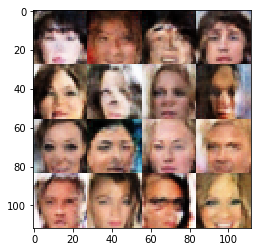

Epoch 3/5... Discriminator Loss: 0.6648... Generator Loss: 2.2462
Epoch 3/5... Discriminator Loss: 1.8845... Generator Loss: 0.2329
Epoch 3/5... Discriminator Loss: 0.5039... Generator Loss: 1.3366
Epoch 3/5... Discriminator Loss: 1.0991... Generator Loss: 0.5430
Epoch 3/5... Discriminator Loss: 0.9639... Generator Loss: 0.6500


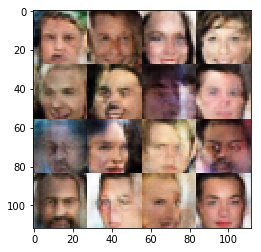

Epoch 3/5... Discriminator Loss: 0.9681... Generator Loss: 0.7088
Epoch 3/5... Discriminator Loss: 1.0809... Generator Loss: 2.0167
Epoch 3/5... Discriminator Loss: 0.2464... Generator Loss: 2.1448
Epoch 3/5... Discriminator Loss: 0.9623... Generator Loss: 0.7655
Epoch 3/5... Discriminator Loss: 1.4308... Generator Loss: 0.3685


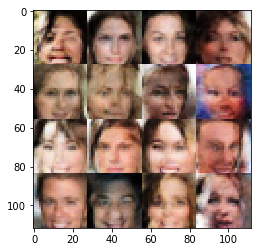

Epoch 3/5... Discriminator Loss: 0.4578... Generator Loss: 1.5457
Epoch 3/5... Discriminator Loss: 0.3833... Generator Loss: 2.8759
Epoch 3/5... Discriminator Loss: 1.1948... Generator Loss: 0.5375
Epoch 3/5... Discriminator Loss: 0.3951... Generator Loss: 2.4886
Epoch 3/5... Discriminator Loss: 0.9091... Generator Loss: 0.6407


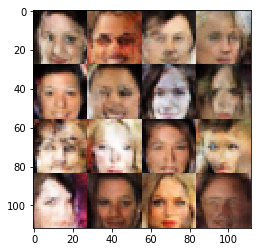

Epoch 3/5... Discriminator Loss: 1.8527... Generator Loss: 4.2721
Epoch 3/5... Discriminator Loss: 1.0429... Generator Loss: 1.0778
Epoch 3/5... Discriminator Loss: 0.7361... Generator Loss: 1.0581
Epoch 3/5... Discriminator Loss: 0.5969... Generator Loss: 1.1867
Epoch 3/5... Discriminator Loss: 0.7583... Generator Loss: 0.8500


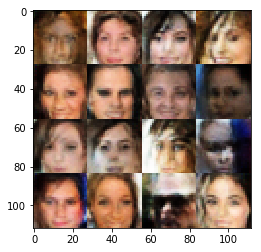

Epoch 3/5... Discriminator Loss: 1.4238... Generator Loss: 0.3655
Epoch 3/5... Discriminator Loss: 1.1185... Generator Loss: 1.6330
Epoch 3/5... Discriminator Loss: 0.4820... Generator Loss: 1.5411
Epoch 3/5... Discriminator Loss: 0.8664... Generator Loss: 0.7764
Epoch 3/5... Discriminator Loss: 1.7516... Generator Loss: 0.2996


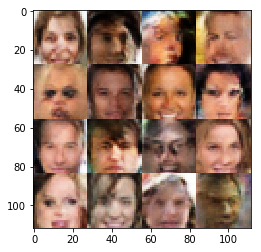

Epoch 3/5... Discriminator Loss: 1.0777... Generator Loss: 0.5562
Epoch 3/5... Discriminator Loss: 0.4963... Generator Loss: 1.1924
Epoch 3/5... Discriminator Loss: 1.0328... Generator Loss: 0.6443
Epoch 3/5... Discriminator Loss: 1.6476... Generator Loss: 0.2795
Epoch 3/5... Discriminator Loss: 0.7576... Generator Loss: 1.0402


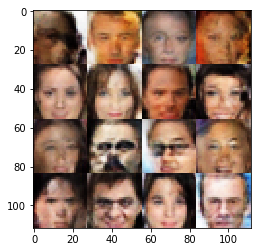

Epoch 3/5... Discriminator Loss: 1.8241... Generator Loss: 2.7237
Epoch 3/5... Discriminator Loss: 0.0580... Generator Loss: 4.2530
Epoch 3/5... Discriminator Loss: 0.7228... Generator Loss: 2.0737
Epoch 3/5... Discriminator Loss: 0.6833... Generator Loss: 2.5604
Epoch 3/5... Discriminator Loss: 0.5647... Generator Loss: 1.3523


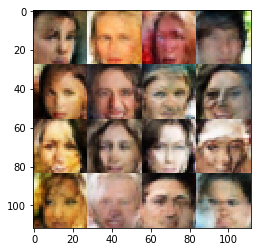

Epoch 3/5... Discriminator Loss: 2.1825... Generator Loss: 0.1810
Epoch 3/5... Discriminator Loss: 1.0297... Generator Loss: 0.6974
Epoch 3/5... Discriminator Loss: 0.7124... Generator Loss: 0.8727
Epoch 3/5... Discriminator Loss: 0.8955... Generator Loss: 0.7221
Epoch 3/5... Discriminator Loss: 1.2888... Generator Loss: 0.4469


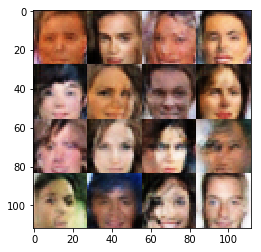

Epoch 3/5... Discriminator Loss: 0.6117... Generator Loss: 1.2860
Epoch 3/5... Discriminator Loss: 0.7395... Generator Loss: 1.0541
Epoch 3/5... Discriminator Loss: 1.5876... Generator Loss: 0.3325
Epoch 3/5... Discriminator Loss: 1.3620... Generator Loss: 0.4429
Epoch 3/5... Discriminator Loss: 0.7314... Generator Loss: 1.7609


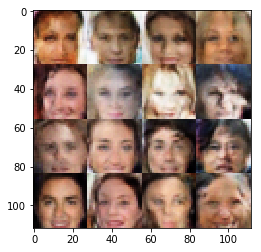

Epoch 3/5... Discriminator Loss: 0.9661... Generator Loss: 0.6322
Epoch 3/5... Discriminator Loss: 0.9680... Generator Loss: 0.6780
Epoch 3/5... Discriminator Loss: 0.5100... Generator Loss: 1.2677
Epoch 3/5... Discriminator Loss: 0.1896... Generator Loss: 2.3875
Epoch 3/5... Discriminator Loss: 1.2207... Generator Loss: 0.5109


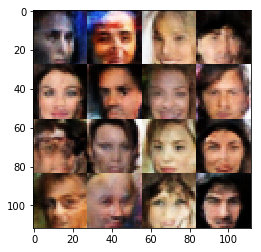

Epoch 3/5... Discriminator Loss: 1.0614... Generator Loss: 0.7074
Epoch 3/5... Discriminator Loss: 0.6219... Generator Loss: 1.5552
Epoch 3/5... Discriminator Loss: 0.9976... Generator Loss: 0.6890
Epoch 3/5... Discriminator Loss: 0.6195... Generator Loss: 1.2431
Epoch 3/5... Discriminator Loss: 0.1889... Generator Loss: 3.4564


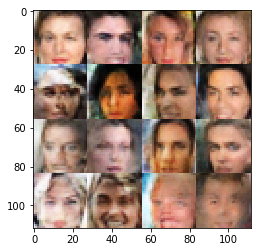

Epoch 3/5... Discriminator Loss: 0.5115... Generator Loss: 2.9225
Epoch 3/5... Discriminator Loss: 0.8656... Generator Loss: 2.4189
Epoch 3/5... Discriminator Loss: 0.4512... Generator Loss: 2.1549
Epoch 3/5... Discriminator Loss: 0.8226... Generator Loss: 0.8841
Epoch 3/5... Discriminator Loss: 1.0028... Generator Loss: 0.6245


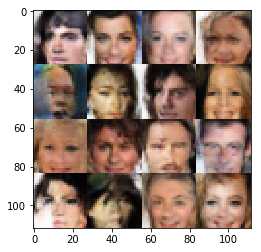

Epoch 3/5... Discriminator Loss: 1.5138... Generator Loss: 0.3626
Epoch 3/5... Discriminator Loss: 0.8050... Generator Loss: 1.0746
Epoch 3/5... Discriminator Loss: 1.7796... Generator Loss: 0.2616
Epoch 3/5... Discriminator Loss: 0.6828... Generator Loss: 1.3692
Epoch 3/5... Discriminator Loss: 0.8109... Generator Loss: 1.5352


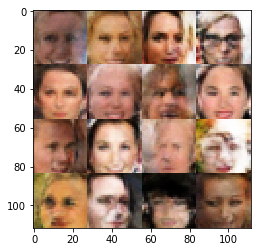

Epoch 3/5... Discriminator Loss: 1.9060... Generator Loss: 0.2082
Epoch 3/5... Discriminator Loss: 1.0616... Generator Loss: 0.7206
Epoch 3/5... Discriminator Loss: 1.3405... Generator Loss: 0.3608
Epoch 3/5... Discriminator Loss: 0.5855... Generator Loss: 1.6353
Epoch 3/5... Discriminator Loss: 1.0020... Generator Loss: 0.7104


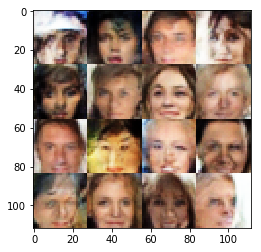

Epoch 3/5... Discriminator Loss: 0.3733... Generator Loss: 1.5751
Epoch 3/5... Discriminator Loss: 0.3845... Generator Loss: 1.5630
Epoch 3/5... Discriminator Loss: 0.7242... Generator Loss: 1.6172
Epoch 3/5... Discriminator Loss: 1.4045... Generator Loss: 0.4290
Epoch 3/5... Discriminator Loss: 0.5649... Generator Loss: 1.7994


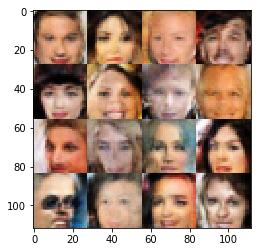

Epoch 3/5... Discriminator Loss: 0.8396... Generator Loss: 0.8122
Epoch 3/5... Discriminator Loss: 0.9811... Generator Loss: 1.2710
Epoch 3/5... Discriminator Loss: 0.9510... Generator Loss: 0.7226
Epoch 3/5... Discriminator Loss: 0.9479... Generator Loss: 1.2430
Epoch 3/5... Discriminator Loss: 1.2388... Generator Loss: 0.4726


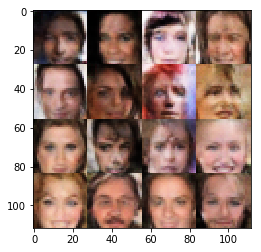

Epoch 3/5... Discriminator Loss: 1.3363... Generator Loss: 0.4066
Epoch 3/5... Discriminator Loss: 1.2413... Generator Loss: 0.5048
Epoch 3/5... Discriminator Loss: 0.7234... Generator Loss: 1.0778
Epoch 3/5... Discriminator Loss: 0.6251... Generator Loss: 1.2738
Epoch 3/5... Discriminator Loss: 0.4343... Generator Loss: 1.4140


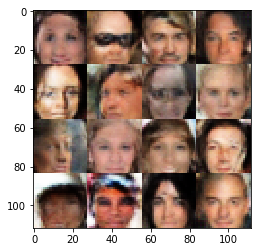

Epoch 3/5... Discriminator Loss: 0.9251... Generator Loss: 0.7263
Epoch 3/5... Discriminator Loss: 1.3706... Generator Loss: 0.4440
Epoch 3/5... Discriminator Loss: 0.5246... Generator Loss: 2.1292
Epoch 3/5... Discriminator Loss: 1.4581... Generator Loss: 0.3690
Epoch 3/5... Discriminator Loss: 1.6864... Generator Loss: 2.8856


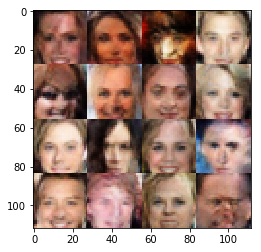

Epoch 3/5... Discriminator Loss: 0.8133... Generator Loss: 3.4477
Epoch 3/5... Discriminator Loss: 1.0328... Generator Loss: 1.1825
Epoch 3/5... Discriminator Loss: 1.0851... Generator Loss: 0.8770
Epoch 3/5... Discriminator Loss: 0.7840... Generator Loss: 1.2239
Epoch 3/5... Discriminator Loss: 0.8839... Generator Loss: 0.8869


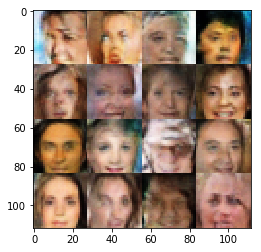

Epoch 3/5... Discriminator Loss: 1.6000... Generator Loss: 0.2881
Epoch 3/5... Discriminator Loss: 0.4567... Generator Loss: 4.6233
Epoch 3/5... Discriminator Loss: 1.2918... Generator Loss: 0.4630
Epoch 3/5... Discriminator Loss: 0.7460... Generator Loss: 0.8112
Epoch 3/5... Discriminator Loss: 0.9798... Generator Loss: 0.6368


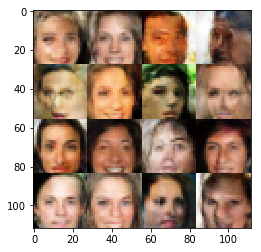

Epoch 3/5... Discriminator Loss: 0.5354... Generator Loss: 1.1275
Epoch 3/5... Discriminator Loss: 1.4017... Generator Loss: 0.3701
Epoch 3/5... Discriminator Loss: 0.3098... Generator Loss: 2.7000
Epoch 3/5... Discriminator Loss: 1.9218... Generator Loss: 2.4516
Epoch 3/5... Discriminator Loss: 1.4194... Generator Loss: 0.3710


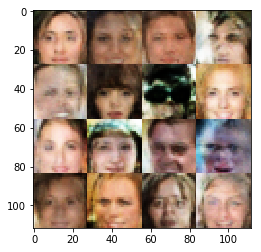

Epoch 3/5... Discriminator Loss: 1.7926... Generator Loss: 0.3108
Epoch 3/5... Discriminator Loss: 0.6773... Generator Loss: 1.0911
Epoch 3/5... Discriminator Loss: 0.6640... Generator Loss: 0.9483
Epoch 3/5... Discriminator Loss: 0.6693... Generator Loss: 1.1811
Epoch 3/5... Discriminator Loss: 0.9293... Generator Loss: 1.0624


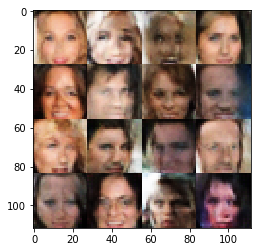

Epoch 3/5... Discriminator Loss: 1.0612... Generator Loss: 0.5744
Epoch 3/5... Discriminator Loss: 0.7081... Generator Loss: 0.9226
Epoch 3/5... Discriminator Loss: 0.5945... Generator Loss: 1.2850
Epoch 3/5... Discriminator Loss: 0.6979... Generator Loss: 0.9496
Epoch 3/5... Discriminator Loss: 0.9587... Generator Loss: 0.6545


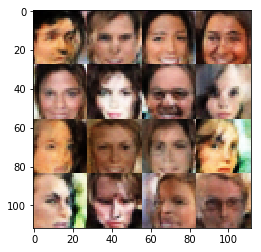

Epoch 3/5... Discriminator Loss: 0.8098... Generator Loss: 0.7761
Epoch 3/5... Discriminator Loss: 1.2244... Generator Loss: 0.4870
Epoch 3/5... Discriminator Loss: 1.2052... Generator Loss: 0.5054
Epoch 3/5... Discriminator Loss: 0.5297... Generator Loss: 1.2358
Epoch 3/5... Discriminator Loss: 1.3870... Generator Loss: 0.3828


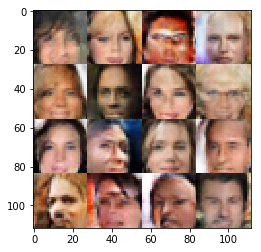

Epoch 3/5... Discriminator Loss: 0.5264... Generator Loss: 1.2531
Epoch 3/5... Discriminator Loss: 0.4330... Generator Loss: 1.6194
Epoch 3/5... Discriminator Loss: 0.5602... Generator Loss: 1.7806
Epoch 3/5... Discriminator Loss: 0.6042... Generator Loss: 1.7351
Epoch 3/5... Discriminator Loss: 1.5610... Generator Loss: 0.3493


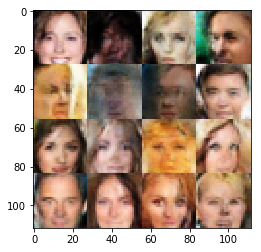

Epoch 3/5... Discriminator Loss: 1.1266... Generator Loss: 2.3465
Epoch 3/5... Discriminator Loss: 2.0177... Generator Loss: 0.2133
Epoch 3/5... Discriminator Loss: 1.5568... Generator Loss: 0.3079
Epoch 3/5... Discriminator Loss: 1.6527... Generator Loss: 0.3054
Epoch 3/5... Discriminator Loss: 0.5822... Generator Loss: 1.3093


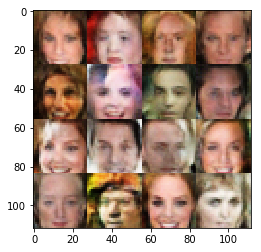

Epoch 3/5... Discriminator Loss: 0.7687... Generator Loss: 1.1265
Epoch 3/5... Discriminator Loss: 0.6857... Generator Loss: 1.3529
Epoch 3/5... Discriminator Loss: 0.6893... Generator Loss: 2.0704
Epoch 3/5... Discriminator Loss: 1.3258... Generator Loss: 0.4205
Epoch 3/5... Discriminator Loss: 0.8435... Generator Loss: 0.9316


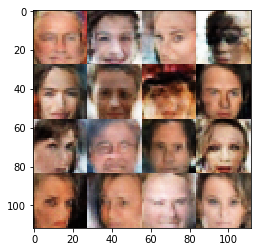

Epoch 3/5... Discriminator Loss: 0.9133... Generator Loss: 0.7481
Epoch 3/5... Discriminator Loss: 0.3429... Generator Loss: 2.0877
Epoch 3/5... Discriminator Loss: 0.7107... Generator Loss: 0.9520
Epoch 3/5... Discriminator Loss: 1.5610... Generator Loss: 0.3535
Epoch 3/5... Discriminator Loss: 1.0279... Generator Loss: 0.5994


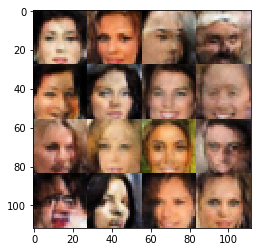

Epoch 3/5... Discriminator Loss: 0.7742... Generator Loss: 1.0487
Epoch 3/5... Discriminator Loss: 1.3376... Generator Loss: 0.4154
Epoch 3/5... Discriminator Loss: 1.6688... Generator Loss: 0.2942
Epoch 3/5... Discriminator Loss: 1.1531... Generator Loss: 0.4825
Epoch 3/5... Discriminator Loss: 0.4513... Generator Loss: 1.4012


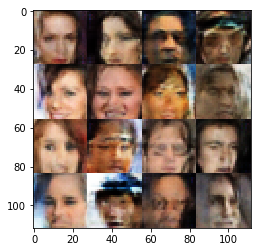

Epoch 3/5... Discriminator Loss: 0.4889... Generator Loss: 1.4189
Epoch 3/5... Discriminator Loss: 0.5030... Generator Loss: 2.6342
Epoch 3/5... Discriminator Loss: 0.1807... Generator Loss: 2.7555
Epoch 3/5... Discriminator Loss: 1.8912... Generator Loss: 0.2341
Epoch 3/5... Discriminator Loss: 1.0619... Generator Loss: 0.6643


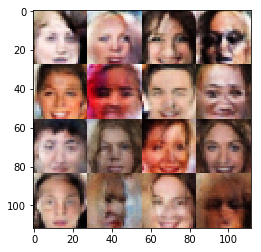

Epoch 3/5... Discriminator Loss: 0.5402... Generator Loss: 1.8083
Epoch 3/5... Discriminator Loss: 1.5629... Generator Loss: 0.3014
Epoch 3/5... Discriminator Loss: 1.0686... Generator Loss: 2.2837
Epoch 3/5... Discriminator Loss: 1.1538... Generator Loss: 0.5182
Epoch 3/5... Discriminator Loss: 0.7960... Generator Loss: 0.7534


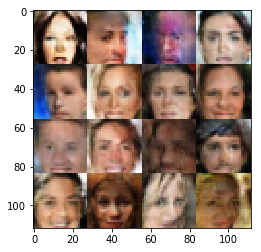

Epoch 3/5... Discriminator Loss: 0.3414... Generator Loss: 1.9859
Epoch 3/5... Discriminator Loss: 0.6004... Generator Loss: 1.0302
Epoch 3/5... Discriminator Loss: 0.5274... Generator Loss: 2.3518
Epoch 3/5... Discriminator Loss: 0.6010... Generator Loss: 3.3568
Epoch 3/5... Discriminator Loss: 1.4788... Generator Loss: 2.1493


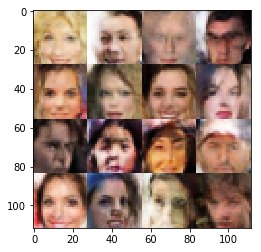

Epoch 3/5... Discriminator Loss: 0.9872... Generator Loss: 1.8161
Epoch 3/5... Discriminator Loss: 0.6745... Generator Loss: 1.1964
Epoch 3/5... Discriminator Loss: 0.6120... Generator Loss: 1.2598
Epoch 3/5... Discriminator Loss: 0.8750... Generator Loss: 0.9690
Epoch 3/5... Discriminator Loss: 1.5186... Generator Loss: 0.3641


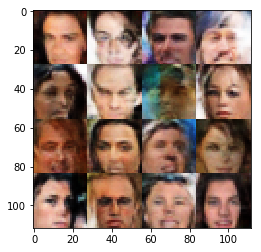

Epoch 3/5... Discriminator Loss: 1.0772... Generator Loss: 0.5791
Epoch 3/5... Discriminator Loss: 0.1095... Generator Loss: 4.7497
Epoch 3/5... Discriminator Loss: 1.2123... Generator Loss: 0.5508
Epoch 3/5... Discriminator Loss: 0.6944... Generator Loss: 1.2530
Epoch 3/5... Discriminator Loss: 1.0687... Generator Loss: 0.5771


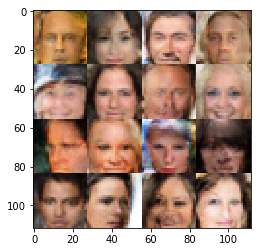

Epoch 3/5... Discriminator Loss: 0.7742... Generator Loss: 0.8894
Epoch 3/5... Discriminator Loss: 0.7724... Generator Loss: 0.9695
Epoch 3/5... Discriminator Loss: 0.8363... Generator Loss: 1.0159
Epoch 3/5... Discriminator Loss: 0.4441... Generator Loss: 2.3219
Epoch 3/5... Discriminator Loss: 1.2352... Generator Loss: 0.4563


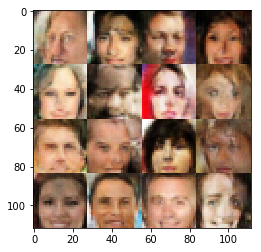

Epoch 3/5... Discriminator Loss: 0.9791... Generator Loss: 0.6638
Epoch 3/5... Discriminator Loss: 0.4575... Generator Loss: 1.9335
Epoch 3/5... Discriminator Loss: 1.4206... Generator Loss: 0.3639
Epoch 3/5... Discriminator Loss: 0.9464... Generator Loss: 1.4207
Epoch 3/5... Discriminator Loss: 0.7676... Generator Loss: 1.9821


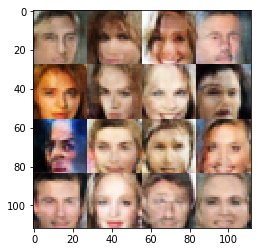

Epoch 3/5... Discriminator Loss: 0.0715... Generator Loss: 4.5744
Epoch 3/5... Discriminator Loss: 1.3677... Generator Loss: 0.4226
Epoch 3/5... Discriminator Loss: 1.3700... Generator Loss: 0.4585
Epoch 3/5... Discriminator Loss: 0.5395... Generator Loss: 2.1038
Epoch 3/5... Discriminator Loss: 0.4246... Generator Loss: 1.6110


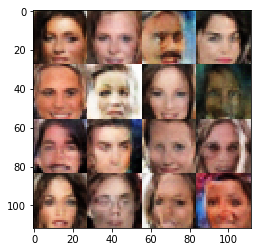

Epoch 3/5... Discriminator Loss: 1.3717... Generator Loss: 0.4099
Epoch 3/5... Discriminator Loss: 1.5880... Generator Loss: 0.3728
Epoch 3/5... Discriminator Loss: 1.2243... Generator Loss: 0.4573
Epoch 3/5... Discriminator Loss: 0.4622... Generator Loss: 1.4152
Epoch 3/5... Discriminator Loss: 1.3718... Generator Loss: 0.4160


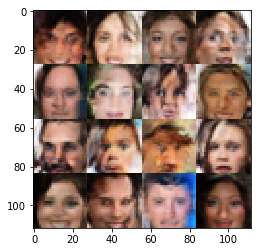

Epoch 3/5... Discriminator Loss: 0.9644... Generator Loss: 0.9310
Epoch 3/5... Discriminator Loss: 0.7122... Generator Loss: 2.4762
Epoch 3/5... Discriminator Loss: 1.4007... Generator Loss: 0.4090
Epoch 3/5... Discriminator Loss: 2.0153... Generator Loss: 0.1842
Epoch 3/5... Discriminator Loss: 0.3690... Generator Loss: 1.6933


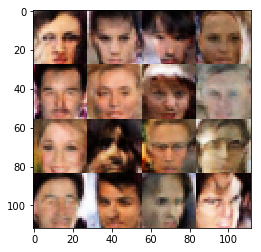

Epoch 3/5... Discriminator Loss: 0.6733... Generator Loss: 2.0297
Epoch 3/5... Discriminator Loss: 1.1400... Generator Loss: 2.6819
Epoch 3/5... Discriminator Loss: 0.8836... Generator Loss: 0.7978
Epoch 3/5... Discriminator Loss: 1.4579... Generator Loss: 2.6327
Epoch 3/5... Discriminator Loss: 1.3287... Generator Loss: 0.3944


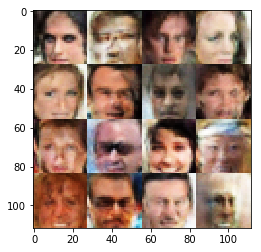

Epoch 3/5... Discriminator Loss: 0.7676... Generator Loss: 0.9154
Epoch 3/5... Discriminator Loss: 1.0007... Generator Loss: 1.7125
Epoch 3/5... Discriminator Loss: 0.7673... Generator Loss: 1.1141
Epoch 3/5... Discriminator Loss: 0.5486... Generator Loss: 1.4144
Epoch 3/5... Discriminator Loss: 0.6908... Generator Loss: 1.0001


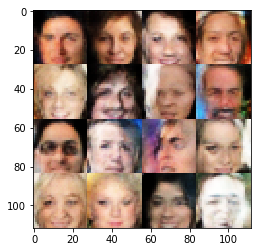

Epoch 3/5... Discriminator Loss: 1.0633... Generator Loss: 0.5716
Epoch 3/5... Discriminator Loss: 1.6928... Generator Loss: 0.2686
Epoch 3/5... Discriminator Loss: 0.8415... Generator Loss: 0.7544
Epoch 3/5... Discriminator Loss: 0.9698... Generator Loss: 0.7803
Epoch 3/5... Discriminator Loss: 1.0746... Generator Loss: 0.5749


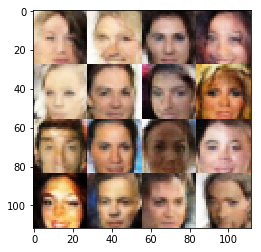

Epoch 3/5... Discriminator Loss: 0.8821... Generator Loss: 0.7718
Epoch 3/5... Discriminator Loss: 1.3566... Generator Loss: 0.4454
Epoch 3/5... Discriminator Loss: 1.0390... Generator Loss: 2.1729
Epoch 3/5... Discriminator Loss: 0.6178... Generator Loss: 1.4372
Epoch 3/5... Discriminator Loss: 0.8078... Generator Loss: 1.3823


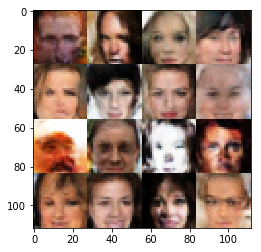

Epoch 3/5... Discriminator Loss: 1.3903... Generator Loss: 0.4021
Epoch 3/5... Discriminator Loss: 0.5992... Generator Loss: 2.0627
Epoch 3/5... Discriminator Loss: 0.9696... Generator Loss: 0.6800
Epoch 3/5... Discriminator Loss: 0.3670... Generator Loss: 1.7451
Epoch 3/5... Discriminator Loss: 0.7259... Generator Loss: 1.1702


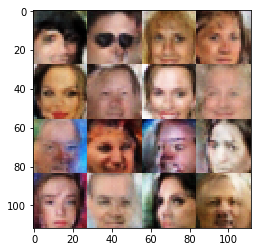

Epoch 3/5... Discriminator Loss: 0.8702... Generator Loss: 0.8334
Epoch 3/5... Discriminator Loss: 1.2101... Generator Loss: 0.5648
Epoch 3/5... Discriminator Loss: 0.5800... Generator Loss: 1.2176
Epoch 3/5... Discriminator Loss: 0.8982... Generator Loss: 0.8701
Epoch 3/5... Discriminator Loss: 0.8036... Generator Loss: 0.7995


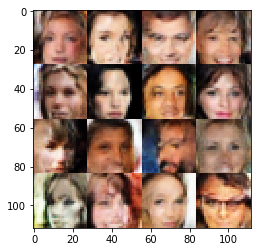

Epoch 3/5... Discriminator Loss: 0.4660... Generator Loss: 1.6992
Epoch 3/5... Discriminator Loss: 0.9603... Generator Loss: 0.6573
Epoch 3/5... Discriminator Loss: 0.7557... Generator Loss: 0.9401
Epoch 3/5... Discriminator Loss: 1.0327... Generator Loss: 0.6673
Epoch 3/5... Discriminator Loss: 0.7473... Generator Loss: 0.9068


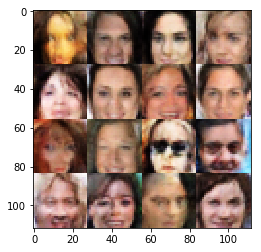

Epoch 3/5... Discriminator Loss: 0.7467... Generator Loss: 1.0053
Epoch 3/5... Discriminator Loss: 0.8923... Generator Loss: 1.9030
Epoch 3/5... Discriminator Loss: 0.6945... Generator Loss: 1.0933
Epoch 3/5... Discriminator Loss: 1.4077... Generator Loss: 0.3767
Epoch 4/5... Discriminator Loss: 0.8613... Generator Loss: 0.9906


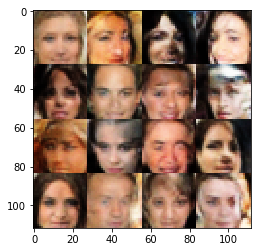

Epoch 4/5... Discriminator Loss: 0.4132... Generator Loss: 2.5039
Epoch 4/5... Discriminator Loss: 1.1882... Generator Loss: 0.5554
Epoch 4/5... Discriminator Loss: 1.1276... Generator Loss: 1.9300
Epoch 4/5... Discriminator Loss: 1.0184... Generator Loss: 0.6272
Epoch 4/5... Discriminator Loss: 0.3303... Generator Loss: 3.4323


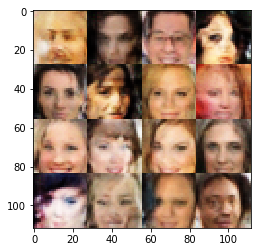

Epoch 4/5... Discriminator Loss: 0.9013... Generator Loss: 0.8542
Epoch 4/5... Discriminator Loss: 0.6738... Generator Loss: 1.0524
Epoch 4/5... Discriminator Loss: 0.9107... Generator Loss: 1.8585
Epoch 4/5... Discriminator Loss: 0.5577... Generator Loss: 1.9977
Epoch 4/5... Discriminator Loss: 0.9284... Generator Loss: 0.8437


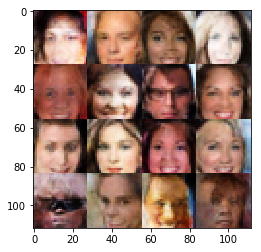

Epoch 4/5... Discriminator Loss: 0.1956... Generator Loss: 2.7433
Epoch 4/5... Discriminator Loss: 1.0548... Generator Loss: 0.5941
Epoch 4/5... Discriminator Loss: 0.7067... Generator Loss: 1.0499
Epoch 4/5... Discriminator Loss: 0.5680... Generator Loss: 2.1397
Epoch 4/5... Discriminator Loss: 1.8971... Generator Loss: 0.2651


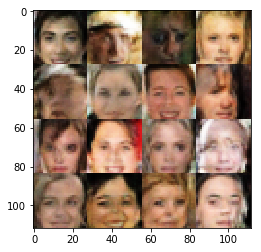

Epoch 4/5... Discriminator Loss: 1.0253... Generator Loss: 0.6460
Epoch 4/5... Discriminator Loss: 0.8042... Generator Loss: 0.7705
Epoch 4/5... Discriminator Loss: 0.7227... Generator Loss: 0.9444
Epoch 4/5... Discriminator Loss: 1.0826... Generator Loss: 0.5703
Epoch 4/5... Discriminator Loss: 0.8459... Generator Loss: 1.5803


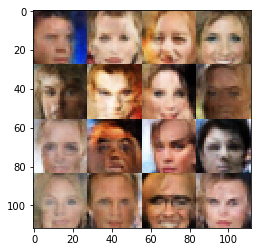

Epoch 4/5... Discriminator Loss: 1.0188... Generator Loss: 0.5961
Epoch 4/5... Discriminator Loss: 0.9557... Generator Loss: 0.6879
Epoch 4/5... Discriminator Loss: 0.7880... Generator Loss: 0.9049
Epoch 4/5... Discriminator Loss: 0.7008... Generator Loss: 1.1587
Epoch 4/5... Discriminator Loss: 0.7670... Generator Loss: 0.9149


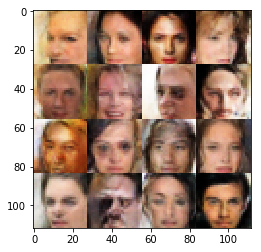

Epoch 4/5... Discriminator Loss: 0.7577... Generator Loss: 0.9691
Epoch 4/5... Discriminator Loss: 1.2773... Generator Loss: 0.4144
Epoch 4/5... Discriminator Loss: 1.5510... Generator Loss: 0.3819
Epoch 4/5... Discriminator Loss: 1.4129... Generator Loss: 0.3983
Epoch 4/5... Discriminator Loss: 0.6374... Generator Loss: 1.6049


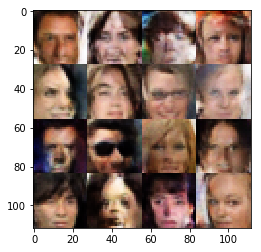

Epoch 4/5... Discriminator Loss: 0.9534... Generator Loss: 0.6738
Epoch 4/5... Discriminator Loss: 0.5180... Generator Loss: 1.7087
Epoch 4/5... Discriminator Loss: 0.6462... Generator Loss: 1.3468
Epoch 4/5... Discriminator Loss: 0.9016... Generator Loss: 0.8786
Epoch 4/5... Discriminator Loss: 0.8501... Generator Loss: 0.7483


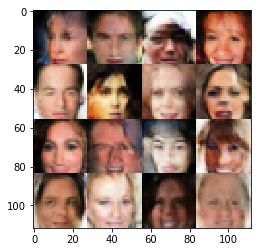

Epoch 4/5... Discriminator Loss: 0.8925... Generator Loss: 0.7586
Epoch 4/5... Discriminator Loss: 0.7531... Generator Loss: 1.5692
Epoch 4/5... Discriminator Loss: 0.5428... Generator Loss: 1.1406
Epoch 4/5... Discriminator Loss: 1.5504... Generator Loss: 0.3189
Epoch 4/5... Discriminator Loss: 3.0703... Generator Loss: 0.0608


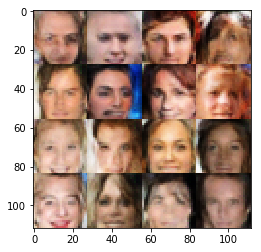

Epoch 4/5... Discriminator Loss: 1.0340... Generator Loss: 0.6021
Epoch 4/5... Discriminator Loss: 0.5157... Generator Loss: 1.2487
Epoch 4/5... Discriminator Loss: 0.8051... Generator Loss: 0.8458
Epoch 4/5... Discriminator Loss: 0.8441... Generator Loss: 0.9810
Epoch 4/5... Discriminator Loss: 0.5792... Generator Loss: 1.1996


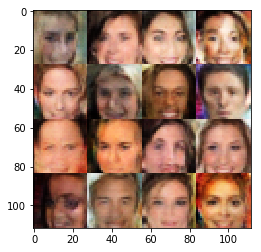

Epoch 4/5... Discriminator Loss: 0.9326... Generator Loss: 0.6544
Epoch 4/5... Discriminator Loss: 0.6370... Generator Loss: 1.1513
Epoch 4/5... Discriminator Loss: 1.0395... Generator Loss: 0.7113
Epoch 4/5... Discriminator Loss: 1.0666... Generator Loss: 0.5960
Epoch 4/5... Discriminator Loss: 0.8797... Generator Loss: 0.7358


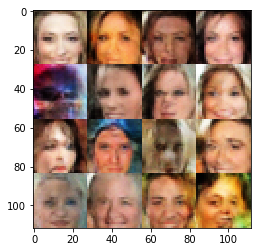

KeyboardInterrupt: 

In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.